In [ ]:
!pip install audiomentations librosa soundfile umap-learn diskcache
%load_ext tensorboard

from google.colab import drive

drive.mount("/content/drive")
PATH = "/content/drive/MyDrive/Deakin/Project-Echo"
DATA_PATH = f"{PATH}/b3"

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.1/86.1 kB 3.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 45.5/45.5 kB 4.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 109.4/109.4 kB 9.3 MB/s eta 0:00:00
Mounted at /content/drive


In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
from torch.hub import load_state_dict_from_url
from torch.utils.tensorboard import SummaryWriter
from torch.amp import autocast, GradScaler
import torch.ao.quantization as quant
from torch.ao.quantization.quantize_fx import prepare_fx, convert_fx, prepare_qat_fx as __prepare_qat_fx
from torch.nn.intrinsic import ConvBn2d

import os
from pathlib import Path
import librosa
import numpy as np
import hashlib
import diskcache as dc
import math
import re
import copy
import datetime
import time
from tqdm import tqdm
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
import random
from audiomentations import Compose, AddGaussianNoise, TimeStretch, PitchShift, Shift
from torchvision import transforms as TorchCompose
import torchvision.models as models
from torchvision.models.efficientnet import EfficientNet, _efficientnet_conf, MBConv, FusedMBConv
from functools import partial
import umap
import matplotlib.pyplot as plt

from sklearn.metrics import (
	accuracy_score,
	precision_score,
	recall_score,
	classification_report,
	confusion_matrix,
)
import seaborn as sns

sns.set_theme()

In [ ]:
import multiprocessing as mp

mp.cpu_count()

8

## Config

In [ ]:
class Config:
	def __init__(self):
		self.system = self.System()
		self.data = self.Data()
		self.training = self.Training()
		self.model = self.Model()
		self.augmentations = self.Augmentations()

	class System:
		audio_data_directory = DATA_PATH
		use_disk_cache = True
		cache_directory = f"{PATH}/cache"

	class Data:
		sample_rate = 48000
		audio_clip_duration = 5.0
		train_split = 0.8
		val_split = 0.2
		n_fft = 2048
		hop_length = 320
		n_mels = 260
		fmin = 20
		fmax = 13000
		top_db = 80.0
		num_classes = None

	class Training:
		def __init__(self):
			self.seed = 0
			self.device = "cuda" if torch.cuda.is_available() else "cpu"
			self.batch_size = 32
			self.num_workers = mp.cpu_count()
			self.epochs = 100
			self.metric_mode = "min"
			self.dtype = "bfloat16"

			self.criterion = "CrossEntropyLoss"
			self.optimizer = "AdamW"
			self.scheduler = "ReduceLROnPlateau"

			self.criterion_params = self.CriterionParams()
			self.optimizer_params = self.OptimizerParams()
			self.scheduler_params = self.SchedulerParams()
			self.distillation = self.Distillation()

		class CriterionParams:
			pass

		class OptimizerParams:
			def __init__(self):
				self.lr = 1e-3

		class SchedulerParams:
			def __init__(self):
				self.mode = "min"
				self.factor = 0.1
				self.patience = 10

		class Distillation:
			def __init__(self):
				self.enabled = False
				self.teacher_model_path = None
				self.criterion = "KLDivLoss"
				self.alpha = 0.5
				self.temperature = 3.0

	class Model:
		def __init__(self):
			self.name = "efficientnetv2"
			self.params = self.Params()

		class Params:
			def __init__(self):
				self.model_name = "efficientnet_v2_s"
				self.pretrained = True
				self.num_classes = None
				self.use_arcface = False
				self.trainable_blocks = 0
				self.use_qat = False

	class Augmentations:
		def __init__(self):
			self.audio = Compose(
				[
					AddGaussianNoise(min_amplitude=0.001, max_amplitude=0.015, p=0.2),
					TimeStretch(min_rate=0.8, max_rate=1.25, p=0.2),
					PitchShift(min_semitones=-4, max_semitones=4, p=0.2),
					Shift(min_shift=-0.5, max_shift=0.5, p=0.2),
				]
			)

			self.image = TorchCompose.Compose(
				[SpecAugment(p=0.5, freq_mask_param=30, time_mask_param=80, n_freq_mask=2, n_time_mask=2)]
			)

		def get_audio_transforms(self):
			return self.audio

		def get_image_transforms(self):
			return self.image

## Model Utilities

In [ ]:
class CosineLinear(nn.Module):
	def __init__(self, in_features, out_features, bias=False):
		super().__init__()

		self.in_features = in_features
		self.out_features = out_features
		self.weight = nn.Parameter(torch.Tensor(out_features, in_features))

		if bias:
			self.bias = nn.Parameter(torch.Tensor(out_features))
		else:
			self.register_parameter("bias", None)

		self.reset_parameters()

	def reset_parameters(self):
		nn.init.kaiming_uniform_(self.weight, a=5)

		if self.bias is not None:
			fan_in, _ = nn.init._calculate_fan_in_and_fan_out(self.weight)
			bound = 1 / math.sqrt(fan_in)
			nn.init.uniform_(self.bias, -bound, bound)

	def forward(self, input):
		cosine = F.linear(F.normalize(input), F.normalize(self.weight))
		if self.bias is not None:
			cosine += self.bias

		return cosine

	def extra_repr(self):
		return "in_features={}, out_features={}, bias={}".format(
			self.in_features, self.out_features, self.bias is not None
		)


class ArcMarginProduct(nn.Module):
	def __init__(self, s: float = 30.0, m: float = 0.50):
		"""
		ArcFace loss to make the classification of each class more distinc
		Based on https://arxiv.org/abs/1801.07698
		"""
		super().__init__()

		self.s = s
		self.m = m

		self.cos_m = math.cos(m)
		self.sin_m = math.sin(m)
		self.th = math.cos(math.pi - m)
		self.mm = math.sin(math.pi - self.m) * self.m

	def forward(self, cosine: torch.Tensor, label: torch.Tensor = None) -> torch.Tensor:
		sine = torch.sqrt((1.0 - torch.pow(cosine, 2)).clamp(0, 1))

		phi = cosine * self.cos_m - sine * self.sin_m
		phi = torch.where(cosine > self.th, phi, cosine - self.mm)

		one_hot = torch.zeros(cosine.size(), device=cosine.device)
		one_hot.scatter_(1, label.view(-1, 1).long(), 1)

		output = (one_hot * phi) + ((1.0 - one_hot) * cosine)
		output = output * self.s

		return output


class CircleLoss(nn.Module):
	def __init__(self, s=80, m=0.4):
		"""
		Based on https://ieeexplore.ieee.org/document/9156774
		"""
		super().__init__()

		self.s = s
		self.m = m

	def forward(self, cosine: torch.Tensor, label: torch.Tensor = None) -> torch.Tensor:
		one_hot = torch.zeros_like(cosine)
		one_hot.scatter_(1, label.view(-1, 1).long(), 1)

		# Calculate margins and scaling factors
		alpha_p = F.relu(-cosine.detach() + 1 + self.m)
		alpha_n = F.relu(cosine.detach() + self.m)
		delta_p = 1 - self.m
		delta_n = self.m

		# Calculate logits for positive and negative pairs
		s_p = self.s * (cosine - delta_p)
		s_n = self.s * (cosine - delta_n)

		pred_class_logits = one_hot * s_p + (1.0 - one_hot) * s_n

		return pred_class_logits

In [ ]:
def get_all_embeddings(model, dataloader, device):
	"""
	Extracts embeddings for all samples in a dataloader using a given model.
	"""
	model.eval()
	all_embeddings = []
	all_labels = []

	with torch.no_grad():
		for inputs, labels in tqdm(dataloader, desc="Generating embeddings"):
			inputs = inputs.to(device)

			outputs = model(inputs)
			all_embeddings.append(outputs.cpu().numpy())
			all_labels.append(labels.cpu().numpy())

	all_embeddings = np.concatenate(all_embeddings, axis=0)
	all_labels = np.concatenate(all_labels, axis=0)
	return all_embeddings, all_labels

In [ ]:
def plot_class_distribution_umap(
	embeddings, labels, class_names, title="UMAP projection of class embeddings", save_path=None
):
	"""
	Generates and displays/saves a UMAP plot of embeddings, colored by class.
	"""
	print("Running UMAP dimensionality reduction...")
	reducer = umap.UMAP(n_neighbors=15, min_dist=0.1, n_components=2, random_state=0, metric="cosine")
	embedding_2d = reducer.fit_transform(embeddings)

	plt.figure(figsize=(14, 12))
	unique_labels = np.unique(labels)

	colors = plt.cm.get_cmap("jet", len(unique_labels))

	for i, label_idx in enumerate(unique_labels):
		class_indices = np.where(labels == label_idx)[0]
		plt.scatter(
			embedding_2d[class_indices, 0],
			embedding_2d[class_indices, 1],
			color=colors(i),
			label=class_names[label_idx],
			alpha=0.7,
			s=10,
		)

	plt.title(title, fontsize=16)
	plt.xlabel("UMAP Dimension 1", fontsize=12)
	plt.ylabel("UMAP Dimension 2", fontsize=12)
	plt.legend(bbox_to_anchor=(1.05, 1), loc="upper left", markerscale=2, fontsize=10)
	plt.grid(True, linestyle="--", alpha=0.6)
	plt.tight_layout(rect=[0, 0, 0.85, 1])  # Adjust layout to make room for legend

	if save_path:
		plt.savefig(save_path, bbox_inches="tight", dpi=300)
		print(f"Plot saved to {save_path}")

	plt.show()

In [ ]:
def init_layer(layer):
	nn.init.xavier_uniform_(layer.weight)
	if hasattr(layer, "bias") and layer.bias is not None:
		layer.bias.data.fill_(0.0)

In [ ]:
def init_bn(bn):
	bn.bias.data.fill_(0.0)
	bn.weight.data.fill_(1.0)

## Augmentations

In [ ]:
class SpecAugment(nn.Module):
	"""
	Spectrogram augmentation module.
	Reference: SpecAugment: A Simple Data Augmentation Method for Automatic Speech Recognition
	(https://arxiv.org/abs/1904.08779)
	"""

	def __init__(self, p=0.5, freq_mask_param=30, time_mask_param=80, n_freq_mask=2, n_time_mask=2):
		super().__init__()
		self.p = p
		self.freq_mask_param = freq_mask_param
		self.time_mask_param = time_mask_param
		self.n_freq_mask = n_freq_mask
		self.n_time_mask = n_time_mask

	def forward(self, x):
		if random.random() > self.p:
			return x

		# x is (C, F, T)
		for _ in range(self.n_freq_mask):
			f = random.randint(0, self.freq_mask_param)
			f0 = random.randint(0, x.shape[1] - f)
			x[:, f0 : f0 + f, :] = 0

		for _ in range(self.n_time_mask):
			t = random.randint(0, self.time_mask_param)
			t0 = random.randint(0, x.shape[2] - t)
			x[:, :, t0 : t0 + t] = 0

		return x

## Models

### SimpleCNN for KD Demo

In [ ]:
class SimpleCNN(nn.Module):
	def __init__(self, num_classes):
		super().__init__()
		self.conv1 = nn.Conv2d(1, 16, kernel_size=3, stride=1, padding=1)
		self.conv2 = nn.Conv2d(16, 32, kernel_size=3, stride=1, padding=1)
		self.pool = nn.MaxPool2d(2, 2)
		self.fc1 = nn.Linear(32 * 16 * 125, 128)
		self.fc2 = nn.Linear(128, num_classes)

	def forward(self, x):
		x = self.pool(F.relu(self.conv1(x)))
		x = self.pool(F.relu(self.conv2(x)))
		x = torch.flatten(x, 1)
		x = F.relu(self.fc1(x))
		x = self.fc2(x)
		return x

### PANNS CNN14

In [ ]:
class ConvBlock(nn.Module):
	def __init__(self, in_channels, out_channels):
		super(ConvBlock, self).__init__()
		self.seq1 = nn.Sequential(
			nn.Conv2d(
				in_channels=in_channels,
				out_channels=out_channels,
				kernel_size=(3, 3),
				stride=(1, 1),
				padding=(1, 1),
				bias=False,
			),
			nn.BatchNorm2d(out_channels),
			nn.ReLU(),
		)
		self.seq2 = nn.Sequential(
			nn.Conv2d(
				in_channels=out_channels,
				out_channels=out_channels,
				kernel_size=(3, 3),
				stride=(1, 1),
				padding=(1, 1),
				bias=False,
			),
			nn.BatchNorm2d(out_channels),
			nn.ReLU(),
		)

		init_layer(self.seq1[0])
		init_layer(self.seq2[0])
		init_bn(self.seq1[1])
		init_bn(self.seq2[1])

	def forward(self, x, pool_size=(2, 2), pool_type="avg"):
		x = self.seq1(x)
		x = self.seq2(x)
		if pool_type == "max":
			x = F.max_pool2d(x, kernel_size=pool_size)
		elif pool_type == "avg":
			x = F.avg_pool2d(x, kernel_size=pool_size)
		return x

In [ ]:
class Cnn14(nn.Module):
	def __init__(self, classes_num):
		super(Cnn14, self).__init__()
		self.conv_block1 = ConvBlock(in_channels=1, out_channels=64)
		self.conv_block2 = ConvBlock(in_channels=64, out_channels=128)
		self.conv_block3 = ConvBlock(in_channels=128, out_channels=256)
		self.conv_block4 = ConvBlock(in_channels=256, out_channels=512)
		self.conv_block5 = ConvBlock(in_channels=512, out_channels=1024)
		self.conv_block6 = ConvBlock(in_channels=1024, out_channels=2048)

		self.fc1 = nn.Linear(2048, 2048, bias=True)
		self.fc_audioset = nn.Linear(2048, classes_num, bias=True)

		init_layer(self.fc1)
		init_layer(self.fc_audioset)

	def forward(self, x):
		x = self.conv_block1(x, pool_size=(2, 2), pool_type="avg")
		x = self.conv_block2(x, pool_size=(2, 2), pool_type="avg")
		x = self.conv_block3(x, pool_size=(2, 2), pool_type="avg")
		x = self.conv_block4(x, pool_size=(2, 2), pool_type="avg")
		x = self.conv_block5(x, pool_size=(2, 2), pool_type="avg")
		x = self.conv_block6(x, pool_size=(1, 1), pool_type="avg")

		x = torch.mean(x, dim=3)
		(x1, _) = torch.max(x, dim=2)
		x2 = torch.mean(x, dim=2)
		x = x1 + x2
		x = F.dropout(x, p=0.5, training=self.training)
		x = F.relu_(self.fc1(x))
		embedding = F.dropout(x, p=0.5, training=self.training)

		return self.fc_audioset(embedding), embedding

In [ ]:
class PannsCNN14ArcFace(nn.Module):
	def __init__(self, num_classes: int, pretrained: bool, use_arcface: bool = False, **arcface_params):
		super().__init__()
		PRETRAINED_URL = "https://zenodo.org/records/3987831/files/Cnn14_mAP=0.431.pth"
		original_classes = 527
		self.cnn = Cnn14(classes_num=original_classes)

		if pretrained:
			print("Loading pretrained Cnn14 weights.")
			state_dict = load_state_dict_from_url(PRETRAINED_URL, progress=True)["model"]
			new_state_dict = {}
			for k, v in state_dict.items():
				new_k = k
				if "conv_block" in k:
					new_k = re.sub(r"\.conv1\.", ".seq1.0.", new_k)
					new_k = re.sub(r"\.bn1\.", ".seq1.1.", new_k)
					new_k = re.sub(r"\.conv2\.", ".seq2.0.", new_k)
					new_k = re.sub(r"\.bn2\.", ".seq2.1.", new_k)
				new_state_dict[new_k] = v
			self.cnn.load_state_dict(new_state_dict, strict=False)

		self.use_arcface = use_arcface
		in_features = self.cnn.fc_audioset.in_features
		if self.use_arcface:
			self.head = ArcMarginProduct(in_features, num_classes, **arcface_params)
		else:
			self.head = nn.Linear(in_features, num_classes)
		self.cnn.fc_audioset = nn.Identity()

	def forward(self, x: torch.Tensor, labels: torch.Tensor = None) -> torch.Tensor:
		if x.dim() == 3:
			x = x.unsqueeze(1)
		_, embedding = self.cnn(x)
		if self.use_arcface:
			if self.training:
				if labels is None:
					raise ValueError("Labels are required for ArcFace training.")
				return self.head(embedding, labels)
			else:
				return F.normalize(embedding, p=2, dim=1)
		else:
			return self.head(embedding)

	def fuse_model(self):
		if self.training:
			print("Warning: Model fusion should be applied in eval mode. No fusion performed.")
			return

		for module in self.modules():
			if isinstance(module, ConvBlock):
				torch.ao.quantization.fuse_modules(module.seq1, ["0", "1", "2"], inplace=True)
				torch.ao.quantization.fuse_modules(module.seq2, ["0", "1", "2"], inplace=True)

		print("Model fusion completed successfully.")

### PANNS MobileNetV1

In [ ]:
def conv_bn_v1(inp, oup, stride):
	return nn.Sequential(nn.Conv2d(inp, oup, 3, stride, 1, bias=False), nn.BatchNorm2d(oup), nn.ReLU(inplace=True))

In [ ]:
def conv_dw_v1(inp, oup, stride):
	return nn.Sequential(
		nn.Conv2d(inp, inp, 3, stride, 1, groups=inp, bias=False),
		nn.BatchNorm2d(inp),
		nn.ReLU(inplace=True),
		nn.Conv2d(inp, oup, 1, 1, 0, bias=False),
		nn.BatchNorm2d(oup),
		nn.ReLU(inplace=True),
	)

In [ ]:
class MobileNetV1(nn.Module):
	def __init__(self, classes_num):
		super(MobileNetV1, self).__init__()
		self.features = nn.Sequential(
			conv_bn_v1(1, 32, 2),
			conv_dw_v1(32, 64, 1),
			conv_dw_v1(64, 128, 2),
			conv_dw_v1(128, 128, 1),
			conv_dw_v1(128, 256, 2),
			conv_dw_v1(256, 256, 1),
			conv_dw_v1(256, 512, 2),
			conv_dw_v1(512, 512, 1),
			conv_dw_v1(512, 512, 1),
			conv_dw_v1(512, 512, 1),
			conv_dw_v1(512, 512, 1),
			conv_dw_v1(512, 512, 1),
			conv_dw_v1(512, 1024, 2),
			conv_dw_v1(1024, 1024, 1),
		)
		self.fc = nn.Linear(1024, 1024, bias=True)
		self.fc_audioset = nn.Linear(1024, classes_num, bias=True)
		self.init_weights()

	def init_weights(self):
		for m in self.modules():
			if isinstance(m, nn.Conv2d):
				init_layer(m)
			elif isinstance(m, nn.BatchNorm2d):
				init_bn(m)

		init_layer(self.fc)
		init_layer(self.fc_audioset)

	def forward(self, x):
		x = self.features(x)

		x = F.avg_pool2d(x, (x.size(2), x.size(3)))
		x = x.view(x.size(0), -1)
		x = F.dropout(x, p=0.2, training=self.training)
		x = self.fc(x)

		embedding = F.dropout(x, p=0.2, training=self.training)
		clipwise_output = self.fc_audioset(x)

		return clipwise_output, embedding

In [ ]:
class PannsMobileNetV1ArcFace(nn.Module):
	def __init__(self, num_classes: int, pretrained: bool, use_arcface: bool = False, **arcface_params):
		super().__init__()
		PRETRAINED_URL = "https://zenodo.org/record/3987831/files/MobileNetV1_mAP%3D0.389.pth"
		original_classes = 527
		self.cnn = MobileNetV1(classes_num=original_classes)

		if pretrained:
			print("Loading pretrained MobileNetV1 weights.")
			state_dict = load_state_dict_from_url(PRETRAINED_URL, progress=True)["model"]
			for key in [
				"spectrogram_extractor.stft.conv_real.weight",
				"spectrogram_extractor.stft.conv_imag.weight",
				"logmel_extractor.melW",
				"bn0.weight",
				"bn0.bias",
				"bn0.running_mean",
				"bn0.running_var",
				"bn0.num_batches_tracked",
			]:
				state_dict.pop(key, None)
			self.cnn.load_state_dict(state_dict)
		self.use_arcface = use_arcface

		in_features = self.cnn.fc_audioset.in_features
		if self.use_arcface:
			self.head = ArcMarginProduct(in_features, num_classes, **arcface_params)
		else:
			self.head = nn.Linear(in_features, num_classes)

		self.cnn.fc_audioset = nn.Identity()

	def forward(self, x: torch.Tensor, labels: torch.Tensor = None) -> torch.Tensor:
		if x.dim() == 3:
			x = x.unsqueeze(1)
		_, embedding = self.cnn(x)
		if self.use_arcface:
			if self.training:
				if labels is None:
					raise ValueError("Labels are required for ArcFace training.")

				return self.head(embedding, labels)
			else:
				return F.normalize(embedding, p=2, dim=1)
		else:
			return self.head(embedding)

	def fuse_model(self):
		if self.training:
			print("Warning: Model fusion should be applied in eval mode. No fusion performed.")
			return

		for module in self.cnn.features:
			if isinstance(module, nn.Sequential):
				if len(module) == 3:
					torch.ao.quantization.fuse_modules(module, ["0", "1", "2"], inplace=True)
				elif len(module) == 6:
					torch.ao.quantization.fuse_modules(module, ["0", "1", "2"], inplace=True)
					torch.ao.quantization.fuse_modules(module, ["3", "4", "5"], inplace=True)

		print("Model fusion completed successfully.")

### PANNS MobileNetV2

In [ ]:
class ConvBnReLU6(ConvBn2d):
	def __init__(self, conv, bn):
		super().__init__(conv, bn)
		self.relu6 = nn.ReLU6(inplace=True)

	def forward(self, x):
		x = super(ConvBnReLU6, self).forward(x)
		x = self.relu6(x)
		return x

In [ ]:
def fuse_conv_bn_relu6(conv, bn, relu6):
	assert isinstance(conv, nn.Conv2d) and isinstance(bn, nn.BatchNorm2d) and isinstance(relu6, nn.ReLU6), (
		"Expecting (Conv2d, BatchNorm2d, ReLU6) as input."
	)

	return ConvBnReLU6(conv, bn)

In [ ]:
def conv_bn_v2(inp, oup, stride):
	return nn.Sequential(
		nn.Conv2d(inp, oup, 3, 1, 1, bias=False),
		nn.AvgPool2d(stride),
		nn.BatchNorm2d(oup),
		# nn.ReLU6(inplace=True),
		nn.ReLU(inplace=True),
	)

In [ ]:
def conv_1x1_bn_v2(inp, oup):
	return nn.Sequential(
		nn.Conv2d(inp, oup, 1, 1, 0, bias=False),
		nn.BatchNorm2d(oup),
		# nn.ReLU6(inplace=True),
		nn.ReLU(inplace=True),
	)

In [ ]:
class InvertedResidual(nn.Module):
	def __init__(self, inp, oup, stride, expand_ratio):
		super().__init__()
		self.stride = stride
		assert stride in [1, 2]

		hidden_dim = round(inp * expand_ratio)
		self.use_res_connect = self.stride == 1 and inp == oup

		if expand_ratio == 1:
			self.conv = nn.Sequential(
				# dw
				nn.Conv2d(hidden_dim, hidden_dim, 3, stride, 1, groups=hidden_dim, bias=False),
				nn.AvgPool2d(stride),
				nn.BatchNorm2d(hidden_dim),
				nn.ReLU6(inplace=True),
				# pw-linear
				nn.Conv2d(hidden_dim, oup, 1, 1, 0, bias=False),
				nn.BatchNorm2d(oup),
			)
		else:
			self.conv = nn.Sequential(
				# pw
				nn.Conv2d(inp, hidden_dim, 1, 1, 0, bias=False),
				nn.BatchNorm2d(hidden_dim),
				# nn.ReLU6(inplace=True),
				nn.ReLU(inplace=True),
				# dw
				nn.Conv2d(hidden_dim, hidden_dim, 3, 1, 1, groups=hidden_dim, bias=False),
				nn.AvgPool2d(stride),
				nn.BatchNorm2d(hidden_dim),
				# nn.ReLU6(inplace=True),
				nn.ReLU(inplace=True),
				# pw-linear
				nn.Conv2d(hidden_dim, oup, 1, 1, 0, bias=False),
				nn.BatchNorm2d(oup),
			)

	def forward(self, x):
		if self.use_res_connect:
			return x + self.conv(x)
		else:
			return self.conv(x)

In [ ]:
class MobileNetV2(nn.Module):
	def __init__(self, classes_num=527, **kwargs):
		super(MobileNetV2, self).__init__()

		num_features = kwargs.get("num_features", 64)
		embedding_size = kwargs.get("embedding_size", 1280)

		self.bn0 = nn.BatchNorm2d(num_features)

		width_mult = 1.0
		block = InvertedResidual
		input_channel = 32
		last_channel = 1280
		inverted_residual_setting = [
			# t, c, n, s
			[1, 16, 1, 1],
			[6, 24, 2, 2],
			[6, 32, 3, 2],
			[6, 64, 4, 2],
			[6, 96, 3, 2],
			[6, 160, 3, 1],
			[6, 320, 1, 1],
		]

		input_channel = int(input_channel * width_mult)
		self.last_channel = int(last_channel * width_mult) if width_mult > 1.0 else last_channel
		self.features = [conv_bn_v2(1, input_channel, (2, 2))]

		for t, c, n, s in inverted_residual_setting:
			output_channel = int(c * width_mult)
			for i in range(n):
				stride = s if i == 0 else 1
				self.features.append(block(input_channel, output_channel, stride, expand_ratio=t))
				input_channel = output_channel

		self.features.append(conv_1x1_bn_v2(input_channel, self.last_channel))
		self.features = nn.Sequential(*self.features)

		self.fc1 = nn.Linear(1280, embedding_size, bias=True)
		self.fc_audioset = nn.Linear(embedding_size, classes_num, bias=True)

		self.init_weights()

	def init_weights(self):
		init_bn(self.bn0)
		init_layer(self.fc1)
		init_layer(self.fc_audioset)
		for m in self.modules():
			if isinstance(m, nn.Conv2d):
				nn.init.kaiming_normal_(m.weight, mode="fan_out")
				if m.bias is not None:
					nn.init.zeros_(m.bias)
			elif isinstance(m, nn.BatchNorm2d):
				nn.init.ones_(m.weight)
				nn.init.zeros_(m.bias)
			elif isinstance(m, nn.Linear):
				nn.init.normal_(m.weight, 0, 0.01)
				nn.init.zeros_(m.bias)

	def forward(self, x):
		x = x.transpose(1, 2)
		x = self.bn0(x)
		x = x.transpose(1, 2)

		x = self.features(x)
		x = torch.mean(x, dim=3)

		(x1, _) = torch.max(x, dim=2)
		x2 = torch.mean(x, dim=2)
		x = x1 + x2

		x = F.dropout(x, p=0.5, training=self.training)
		x = F.relu_(self.fc1(x))
		embedding = F.dropout(x, p=0.5, training=self.training)
		clipwise_output = self.fc_audioset(embedding)

		return clipwise_output, embedding

In [ ]:
class PannsMobileNetV2ArcFace(nn.Module):
	def __init__(self, num_classes: int, pretrained: bool, use_arcface: bool = False, **arcface_params):
		super().__init__()
		PRETRAINED_URL = "https://zenodo.org/record/3987831/files/MobileNetV2_mAP%3D0.383.pth"
		original_classes = 527
		self.cnn = MobileNetV2(classes_num=original_classes, num_features=64, embedding_size=1024)

		if pretrained:
			print("Loading pretrained MobileNetV2 weights.")
			state_dict = load_state_dict_from_url(PRETRAINED_URL, progress=True)["model"]
			for key in [
				"spectrogram_extractor.stft.conv_real.weight",
				"spectrogram_extractor.stft.conv_imag.weight",
				"logmel_extractor.melW",
			]:
				state_dict.pop(key, None)
			self.cnn.load_state_dict(state_dict)

		self.use_arcface = use_arcface
		in_features = self.cnn.fc_audioset.in_features
		self.cnn.fc_audioset = nn.Identity()

		if self.use_arcface:
			self.head = ArcMarginProduct(in_features, num_classes, **arcface_params)
		else:
			self.head = nn.Linear(in_features, num_classes)

	def forward(self, x: torch.Tensor, labels: torch.Tensor = None) -> torch.Tensor:
		# if x.dim() == 3:
		#   x = x.unsqueeze(1)

		_, embedding = self.cnn(x)
		if self.use_arcface:
			if self.training:
				if labels is None:
					raise ValueError("Labels are required for ArcFace training.")
				return self.head(embedding, labels)
			else:
				return F.normalize(embedding, p=2, dim=1)
		else:
			return self.head(embedding)

	def fuse_model(self):
		if self.training:
			print("Warning: Model fusion should be applied in eval mode. No fusion performed.")
			return

		for module in self.cnn.features:
			if isinstance(module, nn.Sequential) and len(module) == 3:
				torch.ao.quantization.fuse_modules(module, ["0", "1", "2"], inplace=True)
			elif isinstance(module, InvertedResidual) and hasattr(module, "conv"):
				if len(module.conv) == 8:
					torch.ao.quantization.fuse_modules(module.conv, ["0", "1", "2"], inplace=True)
					torch.ao.quantization.fuse_modules(module.conv, ["3", "4", "5"], inplace=True)
					torch.ao.quantization.fuse_modules(module.conv, ["6", "7"], inplace=True)
				elif len(module.conv) == 5:
					torch.ao.quantization.fuse_modules(module.conv, ["0", "1", "2"], inplace=True)
					torch.ao.quantization.fuse_modules(module.conv, ["3", "4"], inplace=True)

		print("Model fusion completed successfully.")

### EfficientNetV2

In [ ]:
MODEL_CONFIGS = {
	"efficientnet_v2_s": {"dropout": 0.2},
	"efficientnet_v2_m": {"dropout": 0.3},
	"efficientnet_v2_l": {"dropout": 0.4},
}

In [ ]:
class EfficientNetV2ArcFace(EfficientNet):
	def __init__(
		self,
		model_name: str,
		pretrained: bool,
		num_classes: int,
		use_arcface: bool,
		in_channels: int = 1,
		trainable_blocks: int = 0,
	):
		if not model_name.startswith("efficientnet_v2"):
			raise ValueError("This class is for EfficientNetV2 models.")

		if model_name not in MODEL_CONFIGS:
			raise ValueError(f"Unsupported model: {model_name}. Try one of {list(MODEL_CONFIGS.keys())}")

		inverted_residual_setting, last_channel = _efficientnet_conf(model_name)
		dropout = MODEL_CONFIGS[model_name]["dropout"]
		original_weights_enum = getattr(models, f"EfficientNet_V2_{model_name.split('_')[-1].title()}_Weights")
		temp_num_classes = len(original_weights_enum.DEFAULT.meta["categories"]) if pretrained else num_classes
		super().__init__(
			inverted_residual_setting, dropout=dropout, last_channel=last_channel, num_classes=temp_num_classes
		)

		if pretrained:
			self.load_state_dict(original_weights_enum.DEFAULT.get_state_dict(progress=True))

		self.use_arcface = use_arcface
		self._modify_first_conv_layer(in_channels, pretrained)
		in_features = self.classifier[1].in_features
		if self.use_arcface:
			self.head = CosineLinear(in_features, num_classes)
		else:
			self.head = nn.Linear(in_features, num_classes)

		self.classifier = nn.Identity()
		self.set_trainable_layers(trainable_blocks)

	def _modify_first_conv_layer(self, in_channels: int, pretrained: bool):
		first_conv = self.features[0][0]
		original_in_channels = first_conv.in_channels
		if in_channels == original_in_channels:
			return
		new_first_conv = nn.Conv2d(
			in_channels=in_channels,
			out_channels=first_conv.out_channels,
			kernel_size=first_conv.kernel_size,
			stride=first_conv.stride,
			padding=first_conv.padding,
			bias=first_conv.bias is not None,
		)
		if pretrained:
			print(
				f"Adapting pretrained weights of first conv layer from {original_in_channels} to {in_channels} channels."
			)
			original_weights = first_conv.weight.data
			new_weights = (
				original_weights.mean(dim=1, keepdim=True)
				if original_in_channels == 3 and in_channels == 1
				else original_weights.sum(dim=1, keepdim=True).repeat(1, in_channels, 1, 1) / original_in_channels
			)
			new_first_conv.weight.data = new_weights
		self.features[0][0] = new_first_conv

	def set_trainable_layers(self, trainable_blocks: int = 0):
		for param in self.parameters():
			param.requires_grad = False

		if trainable_blocks == -1:
			for param in self.parameters():
				param.requires_grad = True
			print("Model unfrozen: All layers are now trainable.")
			return

		for param in self.head.parameters():
			param.requires_grad = True

		if trainable_blocks > 0:
			num_feature_blocks = len(self.features)
			trainable_blocks = min(trainable_blocks, num_feature_blocks)
			for i in range(num_feature_blocks - trainable_blocks, num_feature_blocks):
				for param in self.features[i].parameters():
					param.requires_grad = True

		trainable_msg = (
			f"The head and the last {trainable_blocks} feature blocks are trainable."
			if trainable_blocks > 0
			else "Only the head is trainable."
		)
		print(f"Model layers configured: {trainable_msg}")

	def forward(self, x: torch.Tensor, labels: torch.Tensor = None) -> torch.Tensor:
		embedding = torch.flatten(self.avgpool(self.features(x)), 1)
		outputs = self.head(embedding)

		# if return_embedding:
		return outputs, embedding

		# return outputs

	def _fuse_conv_bn(self, block: nn.Sequential):
		fuse_candidates = [
			[str(i), str(i + 1)]
			for i in range(len(block) - 1)
			if isinstance(block[i], nn.Conv2d) and isinstance(block[i + 1], nn.BatchNorm2d)
		]
		if fuse_candidates:
			torch.ao.quantization.fuse_modules(block, fuse_candidates, inplace=True)

	def fuse_model(self):
		if self.training:
			print("Warning: Model fusion should be applied in eval mode. No fusion performed.")
			return
		self._fuse_conv_bn(self.features[0])
		for module in self.modules():
			if isinstance(module, (MBConv, FusedMBConv)):
				self._fuse_conv_bn(module.block)
		print("Model fusion completed successfully.")

### Universal Model Class

In [ ]:
class Model(nn.Module):
	def __init__(self, cfg: Config):
		super().__init__()
		model_params = cfg.model.params
		common_params = {
			"num_classes": model_params.num_classes,
			"pretrained": model_params.pretrained,
			"use_arcface": model_params.use_arcface,
		}
		if model_params.model_name.startswith("efficientnet_v2"):
			self.model = EfficientNetV2ArcFace(
				model_name=model_params.model_name, trainable_blocks=model_params.trainable_blocks, **common_params
			)
		elif model_params.model_name == "panns_cnn14":
			self.model = PannsCNN14ArcFace(**common_params)
		elif model_params.model_name == "panns_mobilenetv1":
			self.model = PannsMobileNetV1ArcFace(**common_params)
		elif model_params.model_name == "panns_mobilenetv2":
			self.model = PannsMobileNetV2ArcFace(**common_params)
		elif model_params.model_name == "simple_cnn":
			self.model = SimpleCNN(num_classes=model_params.num_classes)
		else:
			raise ValueError(f"Model '{model_params.model_name}' not supported.")

		self.use_qat = model_params.use_qat
		if self.use_qat:
			self.model.eval()
			if hasattr(self.model, "fuse_model"):
				self.model.fuse_model()
			self.model = prepare_qat_fx(self.model)

	def forward(self, *args, **kwargs):
		return self.model(*args, **kwargs)

	def load_state_dict(self, state_dict):
		self.model.load_state_dict(state_dict)

	def state_dict(self):
		return self.model.state_dict()

	def quantise(self, calib_loader=None):
		if not self.use_qat:
			if calib_loader is None:
				raise ValueError("Calibration dataloader is required for post-static quantization.")
			if hasattr(self.model, "fuse_model"):
				self.model.fuse_model()
			self.model = prepare_post_static_quantize_fx(self.model, calib_loader)
		self.model = convert_fx(self.model)

## Quantisation Config

In [ ]:
from torch.ao.quantization.backend_config import BackendConfig

default_qat_qconfig = quant.get_default_qat_qconfig("fbgemm")

per_tensor_weight_handler = quant.FakeQuantize.with_args(
	observer=quant.MovingAverageMinMaxObserver,  # Per-tensor observer
	quant_min=-128,
	quant_max=127,
	dtype=torch.qint8,
	qscheme=torch.per_tensor_affine,
	reduce_range=False,
)

qconfig_per_tensor = quant.QConfig(activation=default_qat_qconfig.activation, weight=per_tensor_weight_handler)

qconfig_mapping = (
	quant.QConfigMapping()
	.set_object_type(torch.nn.Conv2d, qconfig_per_tensor)
	.set_object_type(torch.nn.Linear, qconfig_per_tensor)
	.set_object_type(torch.nn.BatchNorm2d, qconfig_per_tensor)
	.set_object_type(torch.nn.ReLU, qconfig_per_tensor)
)

In [ ]:
def prepare_qat_fx(float_model, input_size=(1, 1, 64, 501)):
	example_inputs = (torch.rand(size=input_size).cpu(),)

	prepared_qat = __prepare_qat_fx(float_model, qconfig_mapping, example_inputs=example_inputs)

	return prepared_qat

In [ ]:
def prepare_post_static_quantize_fx(float_model, calib_dl, input_size=(1, 1, 64, 501)):
	quant_model = copy.deepcopy(float_model).cpu().eval()

	example_inputs = (torch.rand(size=input_size).cpu(),)
	prepared = prepare_fx(quant_model, qconfig_mapping, example_inputs=example_inputs)

	# calibration: run a batch through prepared model
	with torch.no_grad():
		for inputs, _ in calib_dl:
			prepared(inputs.cpu())
			break

	return prepared

## Dataset

In [ ]:
def index_directory(directory, file_types=(".ogg", ".mp3", ".wav", ".flac")):
	audio_files, labels = [], []
	class_names = sorted([d.name for d in Path(directory).glob("*") if d.is_dir()])
	class_to_idx = {name: i for i, name in enumerate(class_names)}

	for class_name in class_names:
		class_dir = Path(directory) / class_name
		for file_path in class_dir.glob("**/*"):
			if file_path.suffix.lower() in file_types:
				audio_files.append(str(file_path))
				labels.append(class_to_idx[class_name])

	return audio_files, labels, class_names

In [ ]:
class SpectrogramDataset(Dataset):
	def __init__(self, audio_files, labels, cfg: Config, audio_transforms=None, image_transforms=None, is_train=False):
		self.audio_files = audio_files
		self.labels = labels
		self.cfg = cfg
		self.audio_transforms = audio_transforms
		self.image_transforms = image_transforms
		self.clip_samples = int(cfg.data.audio_clip_duration * cfg.data.sample_rate)
		self.cache = dc.Cache(cfg.system.cache_directory, size_limit=10**10) if cfg.system.use_disk_cache else None
		self.is_train = is_train

	def _get_cache_key(self, file_path):
		m = hashlib.sha256()
		m.update(str(file_path).encode())
		m.update(str(self.cfg.data.sample_rate).encode())

		return m.hexdigest()

	def __len__(self):
		return len(self.audio_files)

	def __getitem__(self, idx):
		file_path = self.audio_files[idx]
		label = self.labels[idx]
		cache_key = self._get_cache_key(file_path) if self.cache else None
		if cache_key and cache_key in self.cache:
			spectrogram = self.cache[cache_key]
			return torch.from_numpy(spectrogram).float(), torch.tensor(label).long()

		try:
			audio_data, _ = librosa.load(file_path, sr=self.cfg.data.sample_rate, mono=True)
		except Exception as e:
			print(f"Error loading {file_path}: {e}")
			audio_data = np.zeros(self.clip_samples, dtype=np.float32)

		if len(audio_data) > self.clip_samples:
			start = (
				np.random.randint(0, len(audio_data) - self.clip_samples)
				if self.is_train
				else (len(audio_data) - self.clip_samples) // 2
			)
			audio_data = audio_data[start : start + self.clip_samples]
		elif len(audio_data) < self.clip_samples:
			audio_data = np.pad(audio_data, (0, self.clip_samples - len(audio_data)), "constant")

		if self.audio_transforms:
			audio_data = self.audio_transforms(samples=audio_data, sample_rate=self.cfg.data.sample_rate)

		mel_spec = librosa.feature.melspectrogram(
			y=audio_data,
			sr=self.cfg.data.sample_rate,
			n_fft=self.cfg.data.n_fft,
			hop_length=self.cfg.data.hop_length,
			n_mels=self.cfg.data.n_mels,
			fmin=self.cfg.data.fmin,
			fmax=self.cfg.data.fmax,
		)
		mel_spec_db = librosa.power_to_db(mel_spec, ref=np.max, top_db=self.cfg.data.top_db)
		mel_spec_db = (mel_spec_db - mel_spec_db.min()) / (mel_spec_db.max() - mel_spec_db.min() + 1e-6)
		spectrogram = np.expand_dims(mel_spec_db, axis=0)

		spectrogram_tensor = torch.from_numpy(spectrogram).float()
		if self.image_transforms:
			spectrogram_tensor = self.image_transforms(spectrogram_tensor)

		spectrogram = spectrogram_tensor.numpy()
		if cache_key:
			self.cache[cache_key] = spectrogram

		return torch.from_numpy(spectrogram).float(), torch.tensor(label).long()

## Trainer

In [ ]:
class Trainer:
	def __init__(self, cfg: Config, model, train_loader, val_loader, device, name=None, teacher_model=None):
		self.cfg = cfg
		self.model = model.to(device)
		self.train_loader = train_loader
		self.val_loader = val_loader
		self.device = device
		self.teacher_model = teacher_model

		self.dtype = getattr(torch, cfg.training.dtype, torch.bfloat16)
		self.use_amp = (self.dtype == torch.float16) and ("cuda" in self.device.type)
		self.scaler = GradScaler(enabled=self.use_amp)

		self.criterion = self._get_criterion()
		self.optimizer = self._get_optimizer()
		self.scheduler = self._get_scheduler()
		self.metric_loss_module = self._get_metric_loss()

		if self.cfg.training.distillation.enabled:
			self.distillation_criterion = self._get_distillation_criterion()
			if self.teacher_model:
				self.teacher_model.to(self.device)
				self.teacher_model.eval()

		self.name = name if name is not None else "model"
		self.epochs = self.cfg.training.epochs
		self.best_metric = float("inf") if self.cfg.training.metric_mode == "min" else float("-inf")
		self.metric_mode = self.cfg.training.metric_mode

		timestamp = datetime.datetime.now().strftime("%Y-%m-%d_%H-%M-%S")
		self.output_dir = Path(f"{PATH}/outputs/{self.name}/{timestamp}")
		self.output_dir.mkdir(parents=True, exist_ok=True)
		self.best_model_path = self.output_dir / f"best_{self.name}.pth"
		self.writer = SummaryWriter(log_dir=self.output_dir)

	def _get_metric_loss(self):
		metric_loss_module = None
		params = vars(self.cfg.training)
		use_arcface_cfg = params.get("use_arcface", None)
		if use_arcface_cfg == "arcface":
			metric_loss_module = ArcMarginProduct().to(self.device)
		elif use_arcface_cfg == "circle":
			metric_loss_module = CircleLoss().to(self.device)

		return metric_loss_module

	def _get_criterion(self):
		name = self.cfg.training.criterion
		params = vars(self.cfg.training.criterion_params)

		if name == "CrossEntropyLoss":
			return nn.CrossEntropyLoss(**params)
		else:
			raise ValueError(f"Unsupported criterion: {name}")

	def _get_distillation_criterion(self):
		name = self.cfg.training.distillation.criterion
		if name == "KLDivLoss":
			return nn.KLDivLoss(reduction="batchmean")
		else:
			raise ValueError(f"Unsupported distillation criterion: {name}")

	def _get_optimizer(self):
		name = self.cfg.training.optimizer
		params = vars(self.cfg.training.optimizer_params)
		if name == "AdamW":
			return torch.optim.AdamW(self.model.parameters(), **params)
		else:
			raise ValueError(f"Unsupported optimizer: {name}")

	def _get_scheduler(self):
		name = self.cfg.training.scheduler
		params = vars(self.cfg.training.scheduler_params)

		if name == "ReduceLROnPlateau":
			return torch.optim.lr_scheduler.ReduceLROnPlateau(self.optimizer, **params)
		else:
			raise ValueError(f"Unsupported scheduler: {name}")

	def _train_one_epoch(self, pbar, metrics_dict):
		self.model.train()
		running_loss = 0.0
		all_labels, all_predictions = [], []
		for inputs, labels in self.train_loader:
			inputs, labels = inputs.to(self.device), labels.to(self.device)
			self.optimizer.zero_grad()
			with autocast(device_type=self.device.type, dtype=self.dtype, enabled=self.use_amp):
				student_outputs = self.model(inputs)
				if self.metric_loss_module is not None:
					student_outputs = self.metric_loss_module(student_outputs, labels)

				if self.cfg.training.distillation.enabled and self.teacher_model:
					with torch.no_grad():
						teacher_outputs = self.teacher_model(inputs)

					student_loss = self.criterion(student_outputs, labels)
					distillation_loss = self.distillation_criterion(
						F.log_softmax(student_outputs / self.cfg.training.distillation.temperature, dim=1),
						F.softmax(teacher_outputs / self.cfg.training.distillation.temperature, dim=1),
					)
					loss = (
						1.0 - self.cfg.training.distillation.alpha
					) * student_loss + self.cfg.training.distillation.alpha * distillation_loss
				else:
					loss = self.criterion(student_outputs, labels)

			self.scaler.scale(loss).backward()
			self.scaler.step(self.optimizer)
			self.scaler.update()

			running_loss += loss.item() * inputs.size(0)
			_, predicted = torch.max(student_outputs.data, 1)

			all_labels.extend(labels.cpu().numpy())
			all_predictions.extend(predicted.cpu().numpy())

			metrics_dict["batch_loss"] = f"{loss.item():.4f}"
			metrics_dict["phase"] = "train"
			pbar.set_postfix(metrics_dict)

		epoch_loss = running_loss / len(self.train_loader.dataset)
		epoch_acc = accuracy_score(all_labels, all_predictions)

		self.writer.add_scalar("Loss/train", epoch_loss, self.current_epoch)
		self.writer.add_scalar("Accuracy/train", epoch_acc, self.current_epoch)

		return epoch_loss, epoch_acc

	def _evaluate(self, dataloader, pbar, metrics_dict):
		self.model.eval()
		running_loss = 0.0
		all_labels, all_predictions = [], []

		with torch.no_grad():
			for inputs, labels in dataloader:
				inputs, labels = inputs.to(self.device), labels.to(self.device)

				with autocast(device_type=self.device.type, dtype=self.dtype, enabled=self.use_amp):
					outputs = self.model(inputs)
					loss = self.criterion(outputs, labels)

				running_loss += loss.item() * inputs.size(0)
				_, predicted = torch.max(outputs.data, 1)

				all_labels.extend(labels.cpu().numpy())
				all_predictions.extend(predicted.cpu().numpy())

				metrics_dict["phase"] = "val"
				pbar.set_postfix(metrics_dict)

		epoch_loss = running_loss / len(dataloader.dataset)
		epoch_acc = accuracy_score(all_labels, all_predictions)

		return epoch_loss, epoch_acc

	def train(self):
		pbar = tqdm(range(self.epochs), total=self.epochs, desc="Training Progress")
		metrics_dict = {"phase": "train"}

		for epoch in pbar:
			self.current_epoch = epoch + 1
			train_loss, train_acc = self._train_one_epoch(pbar, metrics_dict)
			val_loss, val_acc = self._evaluate(self.val_loader, pbar, metrics_dict)
			metrics_dict.update(
				{
					"train_loss": f"{train_loss:.4f}",
					"train_acc": f"{train_acc:.4f}",
					"val_loss": f"{val_loss:.4f}",
					"val_acc": f"{val_acc:.4f}",
				}
			)
			pbar.set_postfix(metrics_dict)

			self.writer.add_scalar("Loss/val", val_loss, self.current_epoch)
			self.writer.add_scalar("Accuracy/val", val_acc, self.current_epoch)
			current_metric = val_loss if self.cfg.training.metric_mode == "min" else val_acc

			if (self.metric_mode == "min" and current_metric < self.best_metric) or (
				self.metric_mode == "max" and current_metric > self.best_metric
			):
				self.best_metric = current_metric
				torch.save(self.model.state_dict(), self.best_model_path)
			if isinstance(self.scheduler, torch.optim.lr_scheduler.ReduceLROnPlateau):
				self.scheduler.step(val_loss)
			else:
				self.scheduler.step()

		self.writer.close()
		print(f"Training complete. Best model saved to {self.best_model_path}")

	def test(self, test_loader, model_to_test=None, device=None):
		print("Starting evaluation on test set...")
		eval_device = device if device else self.device
		model = model_to_test.to(eval_device) if model_to_test else self.model.to(eval_device)
		if not model_to_test:
			model.load_state_dict(torch.load(self.best_model_path, map_location=eval_device))
		model.eval()
		all_labels, all_predictions = [], []

		inference_times = []
		with torch.no_grad():
			for inputs, labels in tqdm(test_loader, desc="[Testing]"):
				inputs = inputs.to(eval_device)

				start_time = time.time()
				with autocast(device_type=self.device.type, dtype=self.dtype, enabled=self.use_amp):
					outputs = self.model(inputs)
				end_time = time.time()
				inference_times.append(end_time - start_time)

				_, predicted = torch.max(outputs.data, 1)
				all_labels.extend(labels.cpu().numpy())
				all_predictions.extend(predicted.cpu().numpy())

		avg_inference_time = np.mean(inference_times)
		accuracy = accuracy_score(all_labels, all_predictions)
		precision = precision_score(all_labels, all_predictions, average="weighted", zero_division=0)
		recall = recall_score(all_labels, all_predictions, average="weighted", zero_division=0)
		f1 = f1_score(all_labels, all_predictions, average="weighted", zero_division=0)

		print(
			f"\n--- Test Set Metrics ---\nAccuracy: {accuracy:.4f}\nPrecision: {precision:.4f}\nRecall: {recall:.4f}\nF1 Score: {f1:.4f}\nAverage Inference Time: {avg_inference_time:.6f}s\n------------------------"
		)

		return accuracy, precision, recall, f1, avg_inference_time

In [ ]:
def run_experiment(
	cfg: Config, audio_files, labels, class_names, train_loader, val_loader, experiment_name, teacher_model=None
):
	print(f"\n{'=' * 20} Running Experiment: {experiment_name} {'=' * 20}")

	device = torch.device(cfg.training.device)

	model = Model(cfg).to(device)
	trainer = Trainer(cfg, model, train_loader, val_loader, device, name=experiment_name, teacher_model=teacher_model)
	trainer.train()

	print(f"\n--- Testing best floating point model for {experiment_name} ---")
	fp_accuracy, _, _, _, fp_inference_time = trainer.test(val_loader)

	if cfg.model.params.use_arcface:
		print(f"\n--- Generating UMAP for {experiment_name} ---")
		best_model_for_umap = Model(cfg)
		best_model_for_umap.load_state_dict(torch.load(trainer.best_model_path, map_location=device))
		best_model_for_umap.to(device)
		embeddings, true_labels = get_all_embeddings(best_model_for_umap.model, val_loader, device)
		plot_class_distribution_umap(
			embeddings,
			true_labels,
			class_names,
			title=f"UMAP for {experiment_name}",
			save_path=trainer.output_dir / f"umap_{experiment_name}.png",
		)

	if cfg.model.params.use_qat:
		print(f"\n--- Quantizing model for {experiment_name} ---")
		trainer.model.load_state_dict(torch.load(trainer.best_model_path, map_location="cpu"))
		quantized_model = trainer.model.to("cpu")
		quantized_model.quantise(calib_loader=val_loader)

		print(f"\n--- Testing best quantized model for {experiment_name} ---")
		q_accuracy, _, _, _, q_inference_time = trainer.test(
			val_loader, model_to_test=quantized_model, device=torch.device("cpu")
		)
	else:
		q_accuracy, q_inference_time = None, None

	return {
		"fp_accuracy": fp_accuracy,
		"fp_inference_time": fp_inference_time,
		"q_accuracy": q_accuracy,
		"q_inference_time": q_inference_time,
		"best_model_path": trainer.best_model_path,
	}

## Training

## Setting up Dataset

In [ ]:
base_cfg = Config()
torch.manual_seed(base_cfg.training.seed)

In [ ]:
!ls $PATH

b3  cache  outputs  Project-Echo


In [ ]:
audio_files, labels, class_names = index_directory(base_cfg.system.audio_data_directory)
num_classes = len(class_names)
base_cfg.data.num_classes = num_classes
base_cfg.model.params.num_classes = num_classes

In [ ]:
dataset_size = len(audio_files)
train_size = int(base_cfg.data.train_split * dataset_size)
indices = torch.randperm(dataset_size)
train_indices = indices[:train_size]
val_indices = indices[train_size:]

dataset_size

7514

In [ ]:
augs = base_cfg.augmentations
train_dataset = SpectrogramDataset(
	[audio_files[i] for i in train_indices],
	[labels[i] for i in train_indices],
	base_cfg,
	audio_transforms=augs.get_audio_transforms(),
	image_transforms=augs.get_image_transforms(),
	is_train=True,
)
val_dataset = SpectrogramDataset([audio_files[i] for i in val_indices], [labels[i] for i in val_indices], base_cfg)

train_loader = DataLoader(
	train_dataset,
	batch_size=base_cfg.training.batch_size,
	shuffle=True,
	num_workers=base_cfg.training.num_workers,
	pin_memory=True,
)
val_loader = DataLoader(
	val_dataset,
	batch_size=base_cfg.training.batch_size,
	shuffle=False,
	num_workers=base_cfg.training.num_workers,
	pin_memory=True,
)

/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:627: UserWarning: This DataLoader will create 12 worker processes in total. Our suggested max number of worker in current system is 8, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


In [ ]:
%tensorboard --logdir=$PATH/outputs

<IPython.core.display.Javascript object>

## Training

In [ ]:
cfg_no_arcface = copy.deepcopy(base_cfg)
cfg_no_arcface.model.params.model_name = "efficientnet_v2_s"
cfg_no_arcface.model.params.use_qat = True
cfg_no_arcface.model.params.use_arcface = False
cfg_no_arcface.model.params.trainable_blocks = -1
results_no_arcface = run_experiment(
	cfg_no_arcface, audio_files, labels, class_names, train_loader, val_loader, "EFF2_QAT_NoArcFace"
)


==================== Running Experiment: EFF2_QAT_NoArcFace ====================
Downloading: "https://download.pytorch.org/models/efficientnet_v2_s-dd5fe13b.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_v2_s-dd5fe13b.pth


100%|██████████| 82.7M/82.7M [00:00<00:00, 336MB/s]
/tmp/ipython-input-177527490.py:4: DeprecationWarning: torch.ao.quantization is deprecated and will be removed in 2.10. 
For migrations of users: 
1. Eager mode quantization (torch.ao.quantization.quantize, torch.ao.quantization.quantize_dynamic), please migrate to use torchao eager mode quantize_ API instead 
2. FX graph mode quantization (torch.ao.quantization.quantize_fx.prepare_fx,torch.ao.quantization.quantize_fx.convert_fx, please migrate to use torchao pt2e quantization API instead (prepare_pt2e, convert_pt2e) 
3. pt2e quantization has been migrated to torchao (https://github.com/pytorch/ao/tree/main/torchao/quantization/pt2e) 
see https://github.com/pytorch/ao/issues/2259 for more details
  prepared_qat = __prepare_qat_fx(float_model, qconfig_mapping, example_inputs=example_inputs)


Adapting pretrained weights of first conv layer from 3 to 1 channels.
Model unfrozen: All layers are now trainable.
Model fusion completed successfully.


/usr/local/lib/python3.12/dist-packages/torch/ao/quantization/observer.py:246: UserWarning: Please use quant_min and quant_max to specify the range for observers.                     reduce_range will be deprecated in a future release of PyTorch.
  warnings.warn(
Training Progress: 100%|██████████| 100/100 [15:06:04<00:00, 543.64s/it, phase=val, batch_loss=0.0072, train_loss=0.0274, train_acc=0.9932, val_loss=0.3862, val_acc=0.9281]


Training complete. Best model saved to /content/drive/MyDrive/Deakin/Project-Echo/outputs/EFF2_QAT_NoArcFace/2025-09-13_07-29-54/best_EFF2_QAT_NoArcFace.pth

--- Testing best floating point model for EFF2_QAT_NoArcFace ---
Starting evaluation on test set...


[Testing]: 100%|██████████| 47/47 [01:39<00:00,  2.11s/it]



--- Test Set Metrics ---
Accuracy: 0.9242
Precision: 0.9231
Recall: 0.9242
F1 Score: 0.9205
Average Inference Time: 1.588897s
------------------------

--- Quantizing model for EFF2_QAT_NoArcFace ---


/tmp/ipython-input-3493734938.py:46: DeprecationWarning: torch.ao.quantization is deprecated and will be removed in 2.10. 
For migrations of users: 
1. Eager mode quantization (torch.ao.quantization.quantize, torch.ao.quantization.quantize_dynamic), please migrate to use torchao eager mode quantize_ API instead 
2. FX graph mode quantization (torch.ao.quantization.quantize_fx.prepare_fx,torch.ao.quantization.quantize_fx.convert_fx, please migrate to use torchao pt2e quantization API instead (prepare_pt2e, convert_pt2e) 
3. pt2e quantization has been migrated to torchao (https://github.com/pytorch/ao/tree/main/torchao/quantization/pt2e) 
see https://github.com/pytorch/ao/issues/2259 for more details
  self.model = convert_fx(self.model)
/usr/local/lib/python3.12/dist-packages/torch/ao/quantization/observer.py:246: UserWarning: Please use quant_min and quant_max to specify the range for observers.                     reduce_range will be deprecated in a future release of PyTorch.
  warni


--- Testing best quantized model for EFF2_QAT_NoArcFace ---
Starting evaluation on test set...


[Testing]: 100%|██████████| 47/47 [04:15<00:00,  5.43s/it]


--- Test Set Metrics ---
Accuracy: 0.9268
Precision: 0.9253
Recall: 0.9268
F1 Score: 0.9227
Average Inference Time: 4.852655s
------------------------



==================== Running Experiment: EFF2_QAT_Circle ====================
Downloading: "https://download.pytorch.org/models/efficientnet_v2_s-dd5fe13b.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_v2_s-dd5fe13b.pth


100%|██████████| 82.7M/82.7M [00:00<00:00, 280MB/s]
/tmp/ipython-input-177527490.py:4: DeprecationWarning: torch.ao.quantization is deprecated and will be removed in 2.10. 
For migrations of users: 
1. Eager mode quantization (torch.ao.quantization.quantize, torch.ao.quantization.quantize_dynamic), please migrate to use torchao eager mode quantize_ API instead 
2. FX graph mode quantization (torch.ao.quantization.quantize_fx.prepare_fx,torch.ao.quantization.quantize_fx.convert_fx, please migrate to use torchao pt2e quantization API instead (prepare_pt2e, convert_pt2e) 
3. pt2e quantization has been migrated to torchao (https://github.com/pytorch/ao/tree/main/torchao/quantization/pt2e) 
see https://github.com/pytorch/ao/issues/2259 for more details
  prepared_qat = __prepare_qat_fx(float_model, qconfig_mapping, example_inputs=example_inputs)


Adapting pretrained weights of first conv layer from 3 to 1 channels.
Model unfrozen: All layers are now trainable.
Model fusion completed successfully.


/usr/local/lib/python3.12/dist-packages/torch/ao/quantization/observer.py:246: UserWarning: Please use quant_min and quant_max to specify the range for observers.                     reduce_range will be deprecated in a future release of PyTorch.
  warnings.warn(
Training Progress: 100%|██████████| 100/100 [15:03:18<00:00, 541.98s/it, phase=val, batch_loss=0.4950, train_loss=0.1049, train_acc=0.9890, val_loss=4.0831, val_acc=0.9488]


Training complete. Best model saved to /content/drive/MyDrive/Deakin/Project-Echo/outputs/EFF2_QAT_Circle/2025-09-12_07-47-14/best_EFF2_QAT_Circle.pth

--- Testing best floating point model for EFF2_QAT_Circle ---
Starting evaluation on test set...


[Testing]: 100%|██████████| 47/47 [01:39<00:00,  2.11s/it]



--- Test Set Metrics ---
Accuracy: 0.9488
Precision: 0.9530
Recall: 0.9488
F1 Score: 0.9481
Average Inference Time: 1.549049s
------------------------

--- Generating UMAP for EFF2_QAT_Circle ---
Adapting pretrained weights of first conv layer from 3 to 1 channels.
Model unfrozen: All layers are now trainable.
Model fusion completed successfully.


/tmp/ipython-input-177527490.py:4: DeprecationWarning: torch.ao.quantization is deprecated and will be removed in 2.10. 
For migrations of users: 
1. Eager mode quantization (torch.ao.quantization.quantize, torch.ao.quantization.quantize_dynamic), please migrate to use torchao eager mode quantize_ API instead 
2. FX graph mode quantization (torch.ao.quantization.quantize_fx.prepare_fx,torch.ao.quantization.quantize_fx.convert_fx, please migrate to use torchao pt2e quantization API instead (prepare_pt2e, convert_pt2e) 
3. pt2e quantization has been migrated to torchao (https://github.com/pytorch/ao/tree/main/torchao/quantization/pt2e) 
see https://github.com/pytorch/ao/issues/2259 for more details
  prepared_qat = __prepare_qat_fx(float_model, qconfig_mapping, example_inputs=example_inputs)
/usr/local/lib/python3.12/dist-packages/torch/ao/quantization/observer.py:246: UserWarning: Please use quant_min and quant_max to specify the range for observers.                     reduce_range wil

Running UMAP dimensionality reduction...


/tmp/ipython-input-2093011006.py:18: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = plt.cm.get_cmap('jet', len(unique_labels))
/tmp/ipython-input-2093011006.py:36: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout(rect=[0, 0, 0.85, 1]) # Adjust layout to make room for legend


Plot saved to /content/drive/MyDrive/Deakin/Project-Echo/outputs/EFF2_QAT_Circle/2025-09-12_07-47-14/umap_EFF2_QAT_Circle.png


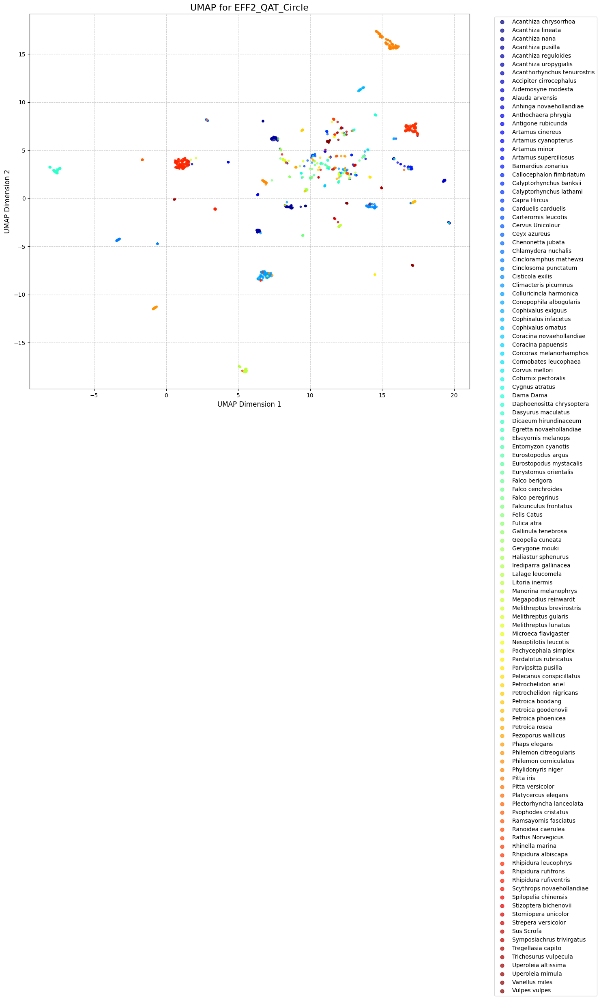


--- Quantizing model for EFF2_QAT_Circle ---


/tmp/ipython-input-3493734938.py:46: DeprecationWarning: torch.ao.quantization is deprecated and will be removed in 2.10. 
For migrations of users: 
1. Eager mode quantization (torch.ao.quantization.quantize, torch.ao.quantization.quantize_dynamic), please migrate to use torchao eager mode quantize_ API instead 
2. FX graph mode quantization (torch.ao.quantization.quantize_fx.prepare_fx,torch.ao.quantization.quantize_fx.convert_fx, please migrate to use torchao pt2e quantization API instead (prepare_pt2e, convert_pt2e) 
3. pt2e quantization has been migrated to torchao (https://github.com/pytorch/ao/tree/main/torchao/quantization/pt2e) 
see https://github.com/pytorch/ao/issues/2259 for more details
  self.model = convert_fx(self.model)
/usr/local/lib/python3.12/dist-packages/torch/ao/quantization/observer.py:246: UserWarning: Please use quant_min and quant_max to specify the range for observers.                     reduce_range will be deprecated in a future release of PyTorch.
  warni


--- Testing best quantized model for EFF2_QAT_Circle ---
Starting evaluation on test set...


[Testing]: 100%|██████████| 47/47 [04:07<00:00,  5.26s/it]


--- Test Set Metrics ---
Accuracy: 0.9481
Precision: 0.9526
Recall: 0.9481
F1 Score: 0.9474
Average Inference Time: 4.736205s
------------------------


In [ ]:
cfg_arcface = copy.deepcopy(base_cfg)
cfg_arcface.model.params.model_name = "efficientnet_v2_s"
cfg_arcface.model.params.use_qat = True
cfg_arcface.model.params.use_arcface = True
cfg_arcface.training.use_arcface = "circle"
cfg_arcface.model.params.trainable_blocks = -1
results_arcface = run_experiment(
	cfg_arcface, audio_files, labels, class_names, train_loader, val_loader, "EFF2_QAT_Circle"
)

In [ ]:
print("\n--- Preparing for Knowledge Distillation Experiment ---")
teacher_model_path = results_no_arcface["best_model_path"]
teacher_cfg = copy.deepcopy(cfg_no_arcface)
teacher_model = Model(teacher_cfg)
teacher_model.load_state_dict(torch.load(teacher_model_path, map_location=torch.device("cpu")))

cfg_kd = copy.deepcopy(base_cfg)
cfg_kd.model.params.model_name = "panns_mobilenetv2"
cfg_kd.model.params.use_qat = False
cfg_kd.model.params.use_arcface = False
cfg_kd.training.distillation.enabled = True
cfg_kd.training.distillation.teacher_model_path = teacher_model_path
results_kd = run_experiment(
	cfg_kd, audio_files, labels, class_names, train_loader, val_loader, "MobileNetV2_KD", teacher_model=teacher_model
)

In [ ]:
teacher_model_path = results_arcface["best_model_path"]
teacher_cfg = copy.deepcopy(cfg_arcface)
teacher_model = Model(teacher_cfg)
teacher_model.load_state_dict(torch.load(teacher_model_path, map_location=torch.device("cpu")))

cfg_kd_arcface = copy.deepcopy(base_cfg)
cfg_kd_arcface.model.params.model_name = "panns_mobilenetv2"
cfg_kd_arcface.model.params.use_qat = False
cfg_kd_arcface.model.params.use_arcface = False
cfg_kd_arcface.training.distillation.enabled = True
cfg_kd_arcface.training.distillation.teacher_model_path = teacher_model_path
results_kd_arcface = run_experiment(
	cfg_kd_arcface,
	audio_files,
	labels,
	class_names,
	train_loader,
	val_loader,
	"MobileNetV2_KD_from_ArcFace",
	teacher_model=teacher_model,
)

In [ ]:
print("\n\n" + "=" * 30)
print("           EXPERIMENT RESULTS")
print("=" * 30)
print("\n--- CNN14 QAT with ArcFace ---")
print(f"  Floating Point Accuracy: {results_arcface['fp_accuracy']:.4f}")
print(f"  Floating Point Inference Time: {results_arcface['fp_inference_time']:.6f}s")
print(f"  Quantized Accuracy: {results_arcface['q_accuracy']:.4f}")
print(f"  Quantized Inference Time: {results_arcface['q_inference_time']:.6f}s")

print("\n--- CNN14 QAT without ArcFace ---")
print(f"  Floating Point Accuracy: {results_no_arcface['fp_accuracy']:.4f}")
print(f"  Floating Point Inference Time: {results_no_arcface['fp_inference_time']:.6f}s")
print(f"  Quantized Accuracy: {results_no_arcface['q_accuracy']:.4f}")
print(f"  Quantized Inference Time: {results_no_arcface['q_inference_time']:.6f}s")

print("\n--- MobileNetV2 with Knowledge Distillation ---")
print(f"  Floating Point Accuracy: {results_kd['fp_accuracy']:.4f}")
print(f"  Floating Point Inference Time: {results_kd['fp_inference_time']:.6f}s")

if results_kd["q_accuracy"] is not None:
	print(f"  Quantized Accuracy: {results_kd['q_accuracy']:.4f}")
	print(f"  Quantized Inference Time: {results_kd['q_inference_time']:.6f}s")

print("\n--- MobileNetV2 with Knowledge Distillation from ArcFace ---")
print(f"  Floating Point Accuracy: {results_kd['fp_accuracy']:.4f}")
print(f"  Floating Point Inference Time: {results_kd['fp_inference_time']:.6f}s")

if results_kd_arcface["q_accuracy"] is not None:
	print(f"  Quantized Accuracy: {results_kd['q_accuracy']:.4f}")
	print(f"  Quantized Inference Time: {results_kd['q_inference_time']:.6f}s")

print("\n" + "=" * 30)

## Testing

In [ ]:
model_paths = [
	"/content/best_EFF2_QAT_Circle.pth",
	"/content/best_EFF2_QAT_NoArcFace.pth",
]

cfg_arcface = copy.deepcopy(base_cfg)
cfg_arcface.model.params.model_name = "efficientnet_v2_s"
cfg_arcface.model.params.use_qat = True
cfg_arcface.model.params.use_arcface = True
cfg_arcface.training.use_arcface = "circle"
cfg_arcface.model.params.trainable_blocks = -1

cfg_no_arcface = copy.deepcopy(base_cfg)
cfg_no_arcface.model.params.model_name = "efficientnet_v2_s"
cfg_no_arcface.model.params.use_qat = True
cfg_no_arcface.model.params.use_arcface = False
cfg_no_arcface.model.params.trainable_blocks = -1

configs = [
	cfg_arcface,
	cfg_no_arcface,
]

In [ ]:
def plot_class_accuracy_charts(class_acc_tuples, model_name_str):
	# --- Top 10 Plot ---
	top_10 = class_acc_tuples[:10]
	top_10_names = [item[0] for item in top_10]
	top_10_accs = [item[1] for item in top_10]

	plt.figure(figsize=(12, 8))
	sns.barplot(x=top_10_accs, y=top_10_names, palette="Greens_r", orient="h")
	plt.title(f"Top 10 Class Accuracies - {model_name_str}", fontsize=16)
	plt.xlabel("Accuracy", fontsize=12)
	plt.ylabel("Class", fontsize=12)
	plt.xlim(0, 1.05)

	for index, value in enumerate(top_10_accs):
		plt.text(value, index, f" {value:.3f}", va="center")
	plt.tight_layout()
	plt.show()

	# --- Worst 10 Plot ---
	worst_10 = class_acc_tuples[-10:]

	worst_10.reverse()
	worst_10_names = [item[0] for item in worst_10]
	worst_10_accs = [item[1] for item in worst_10]

	plt.figure(figsize=(12, 8))
	sns.barplot(x=worst_10_accs, y=worst_10_names, palette="Reds_r", orient="h")
	plt.title(f"Worst 10 Class Accuracies - {model_name_str}", fontsize=16)
	plt.xlabel("Accuracy", fontsize=12)
	plt.ylabel("Class", fontsize=12)
	plt.xlim(0, 1.05)
	for index, value in enumerate(worst_10_accs):
		plt.text(value, index, f" {value:.3f}", va="center")

	plt.tight_layout()
	plt.show()

In [ ]:
def plot_umap(embeddings, labels, class_names, model_name_str):
	print(f"\n### UMAP Visualizations for {model_name_str} ###")

	print("\nGenerating 2D UMAP plot...")
	reducer_2d = umap.UMAP(n_components=2, random_state=42, n_jobs=1)
	embedding_2d = reducer_2d.fit_transform(embeddings)

	plt.figure(figsize=(12, 10))
	scatter = plt.scatter(embedding_2d[:, 0], embedding_2d[:, 1], c=labels, cmap="Spectral", s=5)
	plt.title(f"2D UMAP Projection - {model_name_str}")
	plt.xlabel("UMAP Dimension 1")
	plt.ylabel("UMAP Dimension 2")

	legend_labels = class_names if len(class_names) < 15 else class_names[:: len(class_names) // 15]
	handles, _ = scatter.legend_elements(num=len(legend_labels))
	plt.legend(handles, legend_labels, title="Classes")
	plt.show()

	# --- 3D UMAP ---
	print("Generating 3D UMAP plot...")
	reducer_3d = umap.UMAP(n_components=3, random_state=42, n_jobs=1)
	embedding_3d = reducer_3d.fit_transform(embeddings)

	fig = plt.figure(figsize=(12, 10))
	ax = fig.add_subplot(111, projection="3d")
	scatter = ax.scatter(embedding_3d[:, 0], embedding_3d[:, 1], embedding_3d[:, 2], c=labels, cmap="Spectral", s=5)
	ax.set_title(f"3D UMAP Projection - {model_name_str}")
	ax.legend(handles, legend_labels, title="Classes")
	plt.show()

In [ ]:
def evaluate_models_from_paths(model_paths, configs, test_loader, class_names, device):
	for i, model_path in enumerate(model_paths):
		model_name = Path(model_path).stem.replace("best_", "")
		print(f"\n{'=' * 30}")
		print(f"Evaluating Model: {model_name}")
		print(f"{'=' * 30}\n")

		try:
			model = Model(configs[i])
			model.load_state_dict(torch.load(model_path, map_location=device))
			model = model.to(device)
			model.eval()
			print(f"Successfully loaded model from: {model_path}")
		except Exception as e:
			print(f"Error loading model from {model_path}: {e}")
			continue

		all_labels = []
		all_outputs = []
		all_embeddings = []

		start_time = time.perf_counter()
		total_time = 0.0
		with torch.no_grad():
			for inputs, labels in tqdm(test_loader, desc=f"[{model_name} - Testing]"):
				start_time = time.perf_counter()
				inputs = inputs.to(device)

				outputs, embedding = model(inputs)
				end_time = time.perf_counter()
				total_time += end_time - start_time

				all_labels.extend(labels.cpu().numpy())
				all_outputs.append(outputs.cpu().numpy())
				all_embeddings.append(embedding.cpu().numpy())

		avg_time_per_sample = total_time / len(test_loader.dataset)

		all_labels = np.array(all_labels)
		all_outputs = np.concatenate(all_outputs, axis=0)
		all_embeddings = np.concatenate(all_embeddings, axis=0)

		print(f"\n### Classification Metrics for {model_name} ###\n")
		y_true = all_labels
		y_pred_proba = F.softmax(torch.from_numpy(all_outputs), dim=1).numpy()
		y_pred = np.argmax(y_pred_proba, axis=1)

		print(f"Overall Accuracy: {accuracy_score(y_true, y_pred):.4f}")
		print(f"Total Inference Time: {total_time:.2f} seconds")
		print(f"Average Time per Sample: {avg_time_per_sample * 1000:.4f} ms\n")
		print(f"Weighted Precision: {precision_score(y_true, y_pred, average='weighted', zero_division=0):.4f}")
		print(f"Weighted Recall: {recall_score(y_true, y_pred, average='weighted', zero_division=0):.4f}")
		print(f"Weighted F1-Score: {f1_score(y_true, y_pred, average='weighted', zero_division=0):.4f}\n")

		cm = confusion_matrix(y_true, y_pred)

		with np.errstate(divide="ignore", invalid="ignore"):
			per_class_acc = cm.diagonal() / cm.sum(axis=1)
			per_class_acc = np.nan_to_num(per_class_acc)

		class_acc_tuples = sorted(
			[(class_names[i], acc) for i, acc in enumerate(per_class_acc)], key=lambda item: item[1], reverse=True
		)

		plot_class_accuracy_charts(class_acc_tuples, model_name)
		plot_umap(all_embeddings, all_labels, class_names, f"{model_name}")

		print(f"Evaluating Quantised Model: {model_name}")
		model.quantise(calib_loader=val_loader)

		all_labels = []
		all_outputs = []
		all_embeddings = []

		start_time = time.perf_counter()
		total_time = 0.0
		with torch.no_grad():
			for inputs, labels in tqdm(test_loader, desc=f"[Quantised {model_name} - Testing]"):
				start_time = time.perf_counter()
				inputs = inputs.to(device)

				outputs, embedding = model(inputs)
				end_time = time.perf_counter()
				total_time += end_time - start_time

				all_labels.extend(labels.cpu().numpy())
				all_outputs.append(outputs.cpu().numpy())
				all_embeddings.append(embedding.cpu().numpy())

		avg_time_per_sample = total_time / len(test_loader.dataset)

		all_labels = np.array(all_labels)
		all_outputs = np.concatenate(all_outputs, axis=0)
		all_embeddings = np.concatenate(all_embeddings, axis=0)

		print(f"\n### Classification Metrics for {model_name} ###\n")
		y_true = all_labels
		y_pred_proba = F.softmax(torch.from_numpy(all_outputs), dim=1).numpy()
		y_pred = np.argmax(y_pred_proba, axis=1)

		print(f"Overall Accuracy: {accuracy_score(y_true, y_pred):.4f}")
		print(f"Total Inference Time: {total_time:.2f} seconds")
		print(f"Average Time per Sample: {avg_time_per_sample * 1000:.4f} ms\n")
		print(f"Weighted Precision: {precision_score(y_true, y_pred, average='weighted', zero_division=0):.4f}")
		print(f"Weighted Recall: {recall_score(y_true, y_pred, average='weighted', zero_division=0):.4f}")
		print(f"Weighted F1-Score: {f1_score(y_true, y_pred, average='weighted', zero_division=0):.4f}\n")

		cm = confusion_matrix(y_true, y_pred)

		with np.errstate(divide="ignore", invalid="ignore"):
			per_class_acc = cm.diagonal() / cm.sum(axis=1)
			per_class_acc = np.nan_to_num(per_class_acc)

		class_acc_tuples = sorted(
			[(class_names[i], acc) for i, acc in enumerate(per_class_acc)], key=lambda item: item[1], reverse=True
		)

		plot_class_accuracy_charts(class_acc_tuples, f"Quantised {model_name}")
		plot_umap(all_embeddings, all_labels, class_names, f"Quantised {model_name}")


Evaluating Model: EFF2_QAT_Circle

Adapting pretrained weights of first conv layer from 3 to 1 channels.
Model unfrozen: All layers are now trainable.
Model fusion completed successfully.


/tmp/ipython-input-177527490.py:4: DeprecationWarning: torch.ao.quantization is deprecated and will be removed in 2.10. 
For migrations of users: 
1. Eager mode quantization (torch.ao.quantization.quantize, torch.ao.quantization.quantize_dynamic), please migrate to use torchao eager mode quantize_ API instead 
2. FX graph mode quantization (torch.ao.quantization.quantize_fx.prepare_fx,torch.ao.quantization.quantize_fx.convert_fx, please migrate to use torchao pt2e quantization API instead (prepare_pt2e, convert_pt2e) 
3. pt2e quantization has been migrated to torchao (https://github.com/pytorch/ao/tree/main/torchao/quantization/pt2e) 
see https://github.com/pytorch/ao/issues/2259 for more details
  prepared_qat = __prepare_qat_fx(float_model, qconfig_mapping, example_inputs=example_inputs)
/usr/local/lib/python3.12/dist-packages/torch/ao/quantization/observer.py:246: UserWarning: Please use quant_min and quant_max to specify the range for observers.                     reduce_range wil

Successfully loaded model from: /content/best_EFF2_QAT_Circle.pth


[EFF2_QAT_Circle - Testing]:   0%|          | 0/47 [00:00<?, ?it/s]/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:627: UserWarning: This DataLoader will create 12 worker processes in total. Our suggested max number of worker in current system is 8, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(
[EFF2_QAT_Circle - Testing]: 100%|██████████| 47/47 [17:15<00:00, 22.03s/it]
/tmp/ipython-input-1971603019.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=top_10_accs, y=top_10_names, palette="Greens_r", orient='h')



### Classification Metrics for EFF2_QAT_Circle ###

Overall Accuracy: 0.9488
Total Inference Time: 1006.26 seconds
Average Time per Sample: 669.5015 ms

Weighted Precision: 0.9533
Weighted Recall: 0.9488
Weighted F1-Score: 0.9480



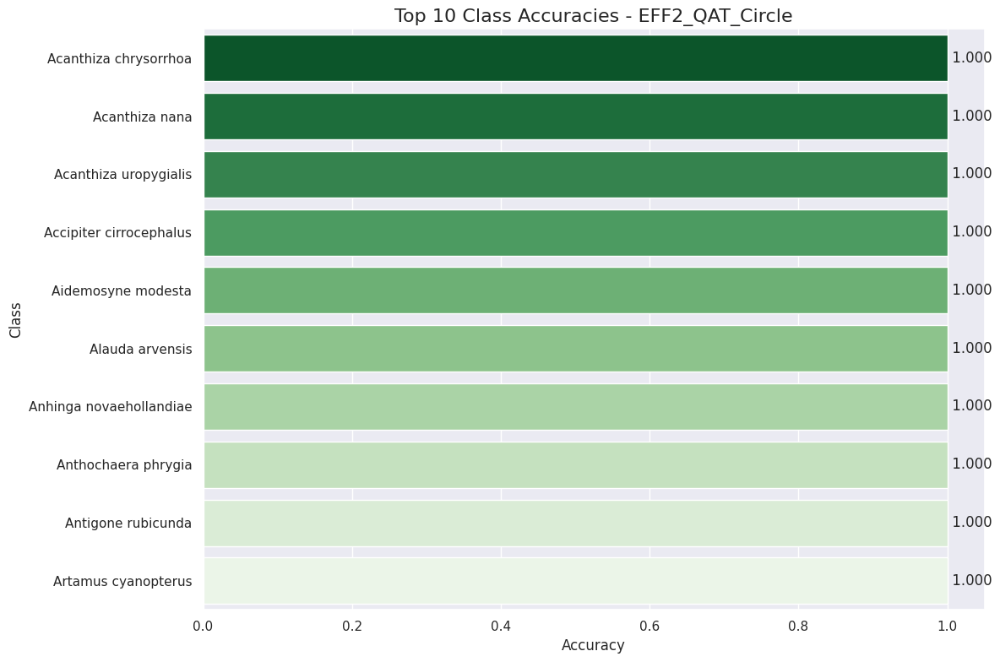

/tmp/ipython-input-1971603019.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=worst_10_accs, y=worst_10_names, palette="Reds_r", orient='h')


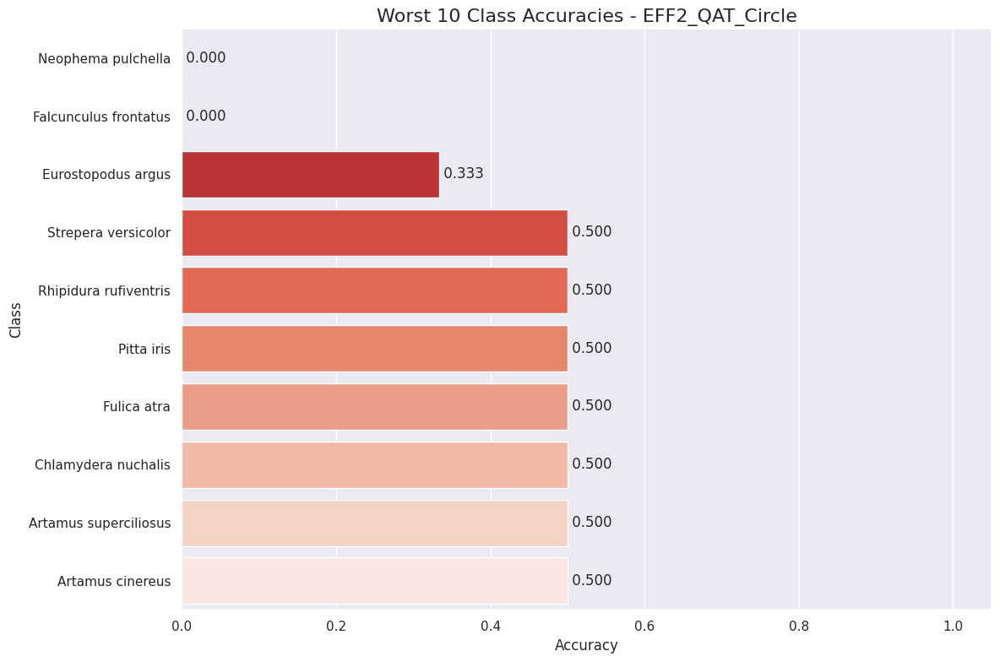


### UMAP Visualizations for EFF2_QAT_Circle ###

Generating 2D UMAP plot...


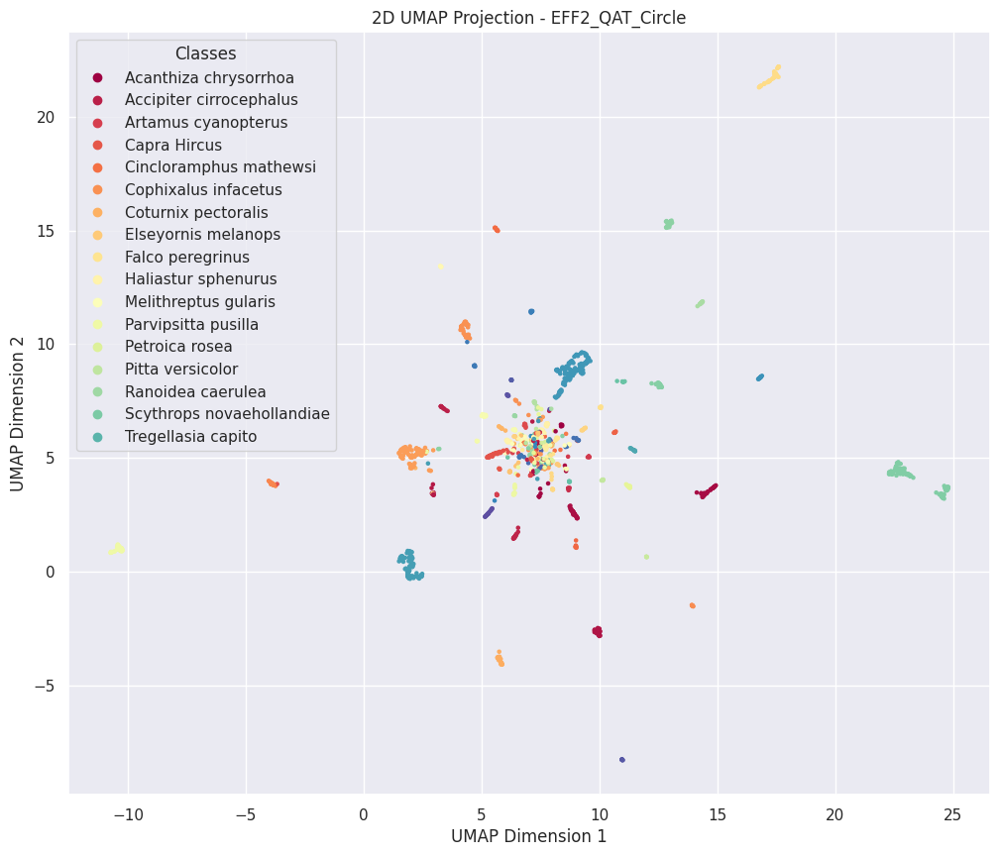

Generating 3D UMAP plot...


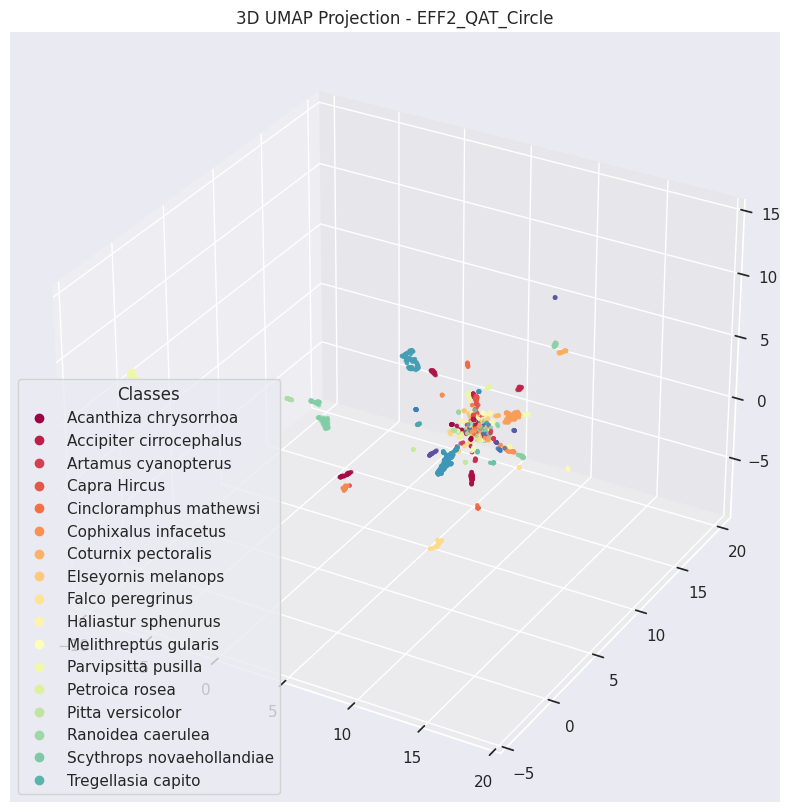

Evaluating Quantised Model: EFF2_QAT_Circle


/tmp/ipython-input-3493734938.py:46: DeprecationWarning: torch.ao.quantization is deprecated and will be removed in 2.10. 
For migrations of users: 
1. Eager mode quantization (torch.ao.quantization.quantize, torch.ao.quantization.quantize_dynamic), please migrate to use torchao eager mode quantize_ API instead 
2. FX graph mode quantization (torch.ao.quantization.quantize_fx.prepare_fx,torch.ao.quantization.quantize_fx.convert_fx, please migrate to use torchao pt2e quantization API instead (prepare_pt2e, convert_pt2e) 
3. pt2e quantization has been migrated to torchao (https://github.com/pytorch/ao/tree/main/torchao/quantization/pt2e) 
see https://github.com/pytorch/ao/issues/2259 for more details
  self.model = convert_fx(self.model)
/usr/local/lib/python3.12/dist-packages/torch/ao/quantization/observer.py:246: UserWarning: Please use quant_min and quant_max to specify the range for observers.                     reduce_range will be deprecated in a future release of PyTorch.
  warni


### Classification Metrics for EFF2_QAT_Circle ###

Overall Accuracy: 0.9441
Total Inference Time: 316.53 seconds
Average Time per Sample: 210.5975 ms

Weighted Precision: 0.9491
Weighted Recall: 0.9441
Weighted F1-Score: 0.9434



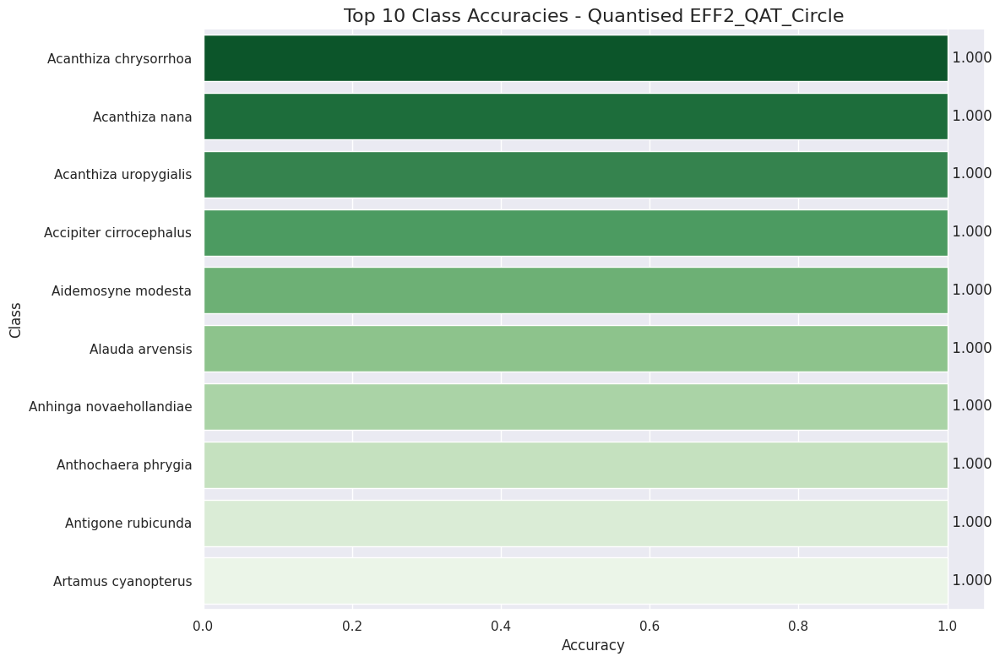

/tmp/ipython-input-1971603019.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=worst_10_accs, y=worst_10_names, palette="Reds_r", orient='h')


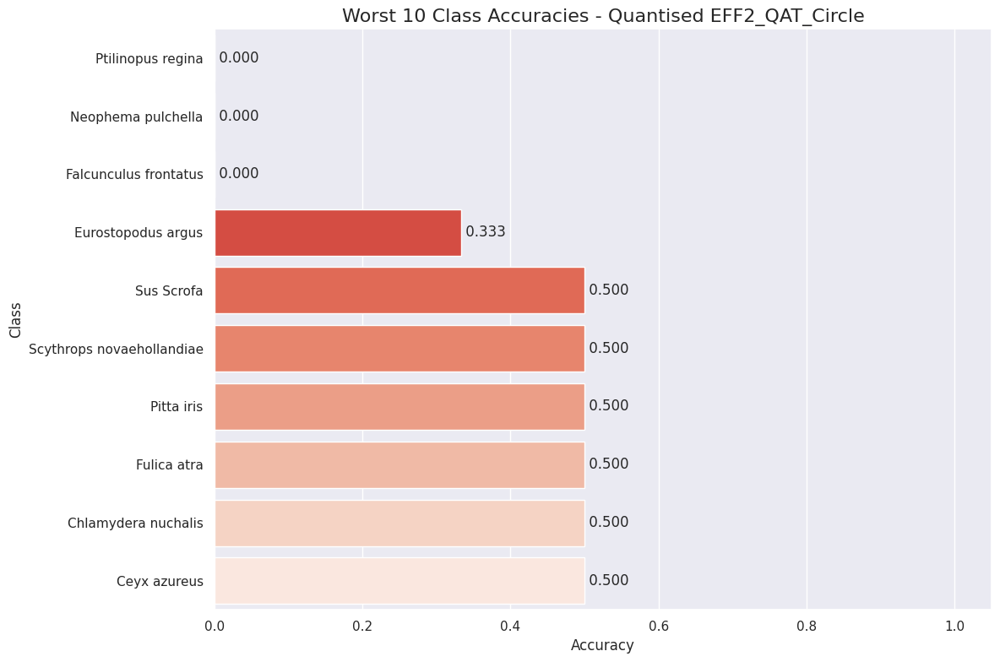


### UMAP Visualizations for Quantised EFF2_QAT_Circle ###

Generating 2D UMAP plot...


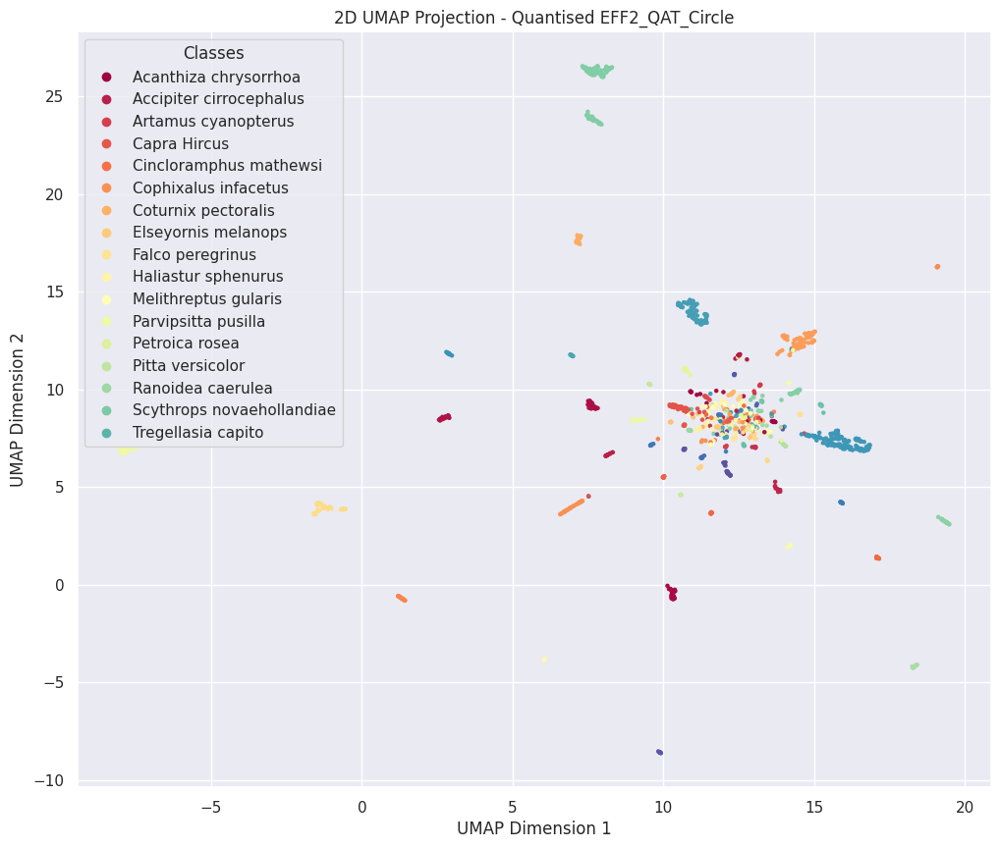

Generating 3D UMAP plot...


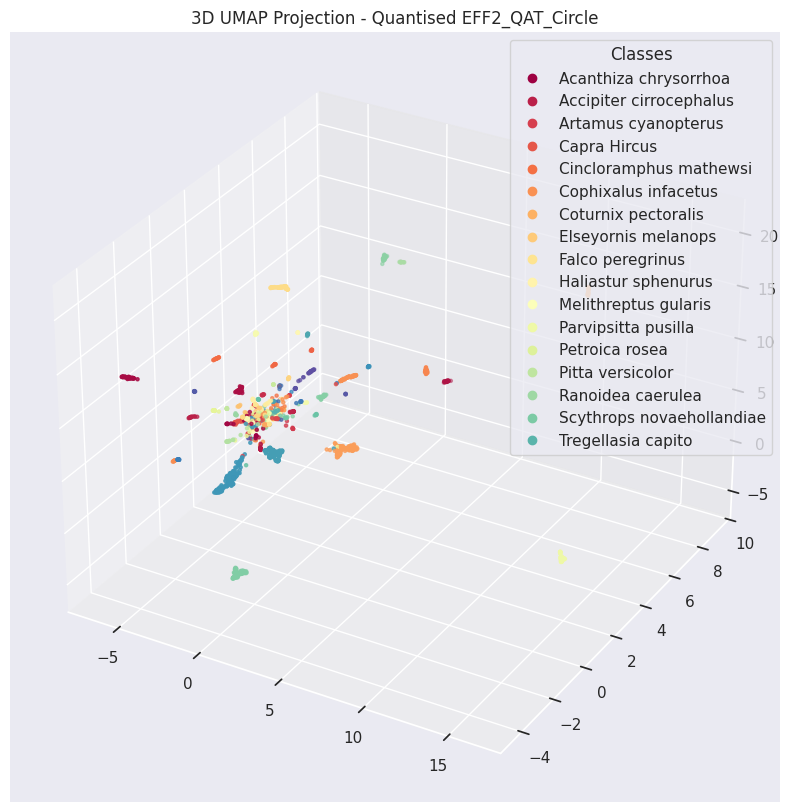


Evaluating Model: EFF2_QAT_NoArcFace

Adapting pretrained weights of first conv layer from 3 to 1 channels.
Model unfrozen: All layers are now trainable.
Model fusion completed successfully.


/tmp/ipython-input-177527490.py:4: DeprecationWarning: torch.ao.quantization is deprecated and will be removed in 2.10. 
For migrations of users: 
1. Eager mode quantization (torch.ao.quantization.quantize, torch.ao.quantization.quantize_dynamic), please migrate to use torchao eager mode quantize_ API instead 
2. FX graph mode quantization (torch.ao.quantization.quantize_fx.prepare_fx,torch.ao.quantization.quantize_fx.convert_fx, please migrate to use torchao pt2e quantization API instead (prepare_pt2e, convert_pt2e) 
3. pt2e quantization has been migrated to torchao (https://github.com/pytorch/ao/tree/main/torchao/quantization/pt2e) 
see https://github.com/pytorch/ao/issues/2259 for more details
  prepared_qat = __prepare_qat_fx(float_model, qconfig_mapping, example_inputs=example_inputs)
/usr/local/lib/python3.12/dist-packages/torch/ao/quantization/observer.py:246: UserWarning: Please use quant_min and quant_max to specify the range for observers.                     reduce_range wil

Successfully loaded model from: /content/best_EFF2_QAT_NoArcFace.pth


[EFF2_QAT_NoArcFace - Testing]:   0%|          | 0/47 [00:00<?, ?it/s]/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:627: UserWarning: This DataLoader will create 12 worker processes in total. Our suggested max number of worker in current system is 8, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(
[EFF2_QAT_NoArcFace - Testing]: 100%|██████████| 47/47 [13:36<00:00, 17.36s/it]
/tmp/ipython-input-1971603019.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=top_10_accs, y=top_10_names, palette="Greens_r", orient='h')



### Classification Metrics for EFF2_QAT_NoArcFace ###

Overall Accuracy: 0.9268
Total Inference Time: 788.60 seconds
Average Time per Sample: 524.6839 ms

Weighted Precision: 0.9262
Weighted Recall: 0.9268
Weighted F1-Score: 0.9232



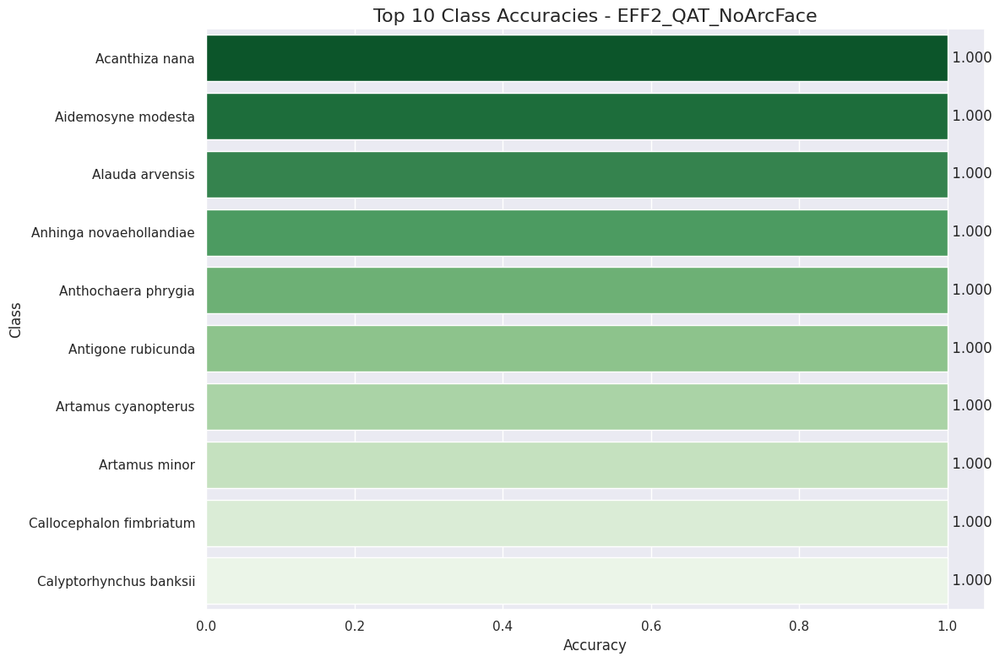

/tmp/ipython-input-1971603019.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=worst_10_accs, y=worst_10_names, palette="Reds_r", orient='h')


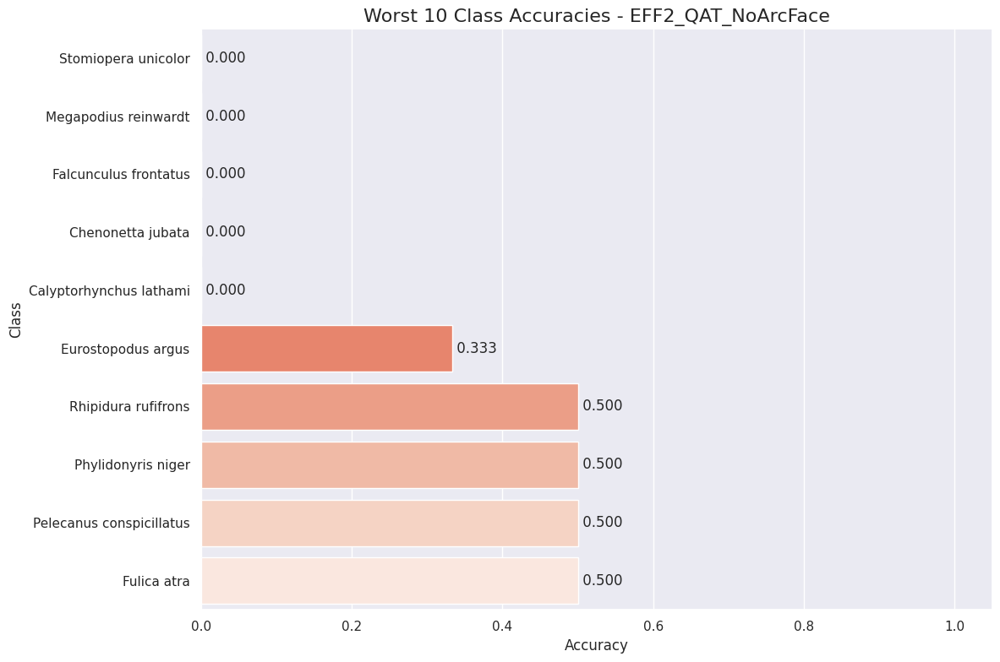


### UMAP Visualizations for EFF2_QAT_NoArcFace ###

Generating 2D UMAP plot...


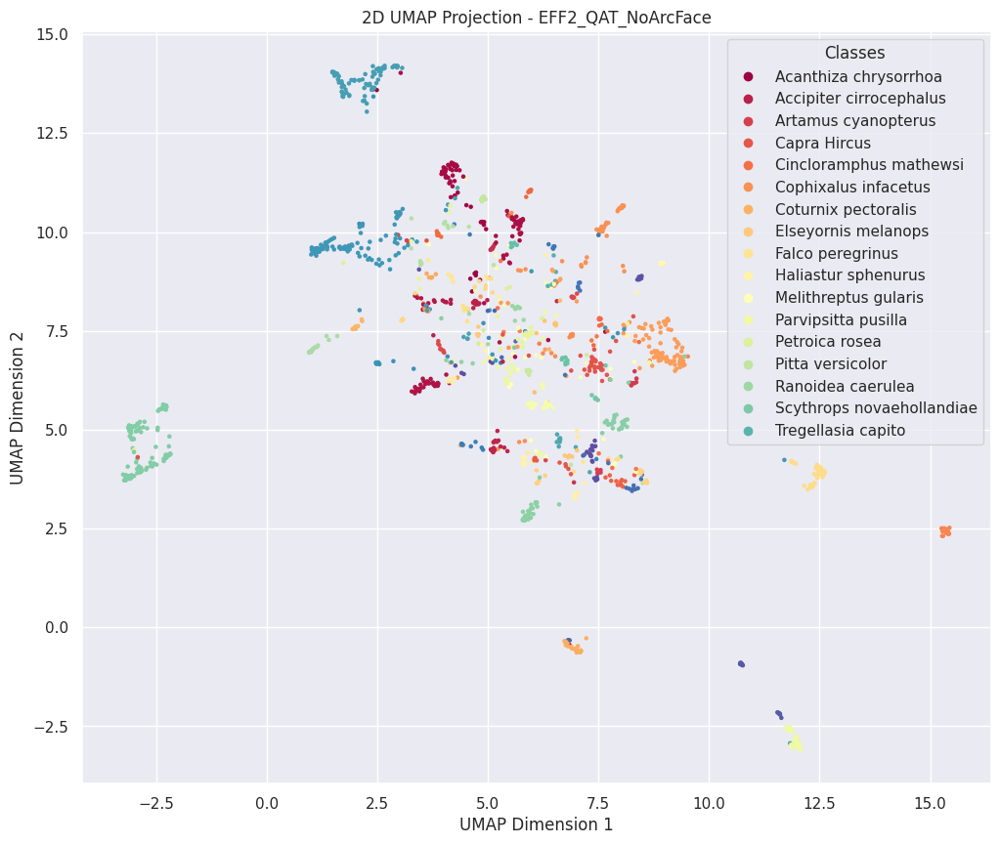

Generating 3D UMAP plot...


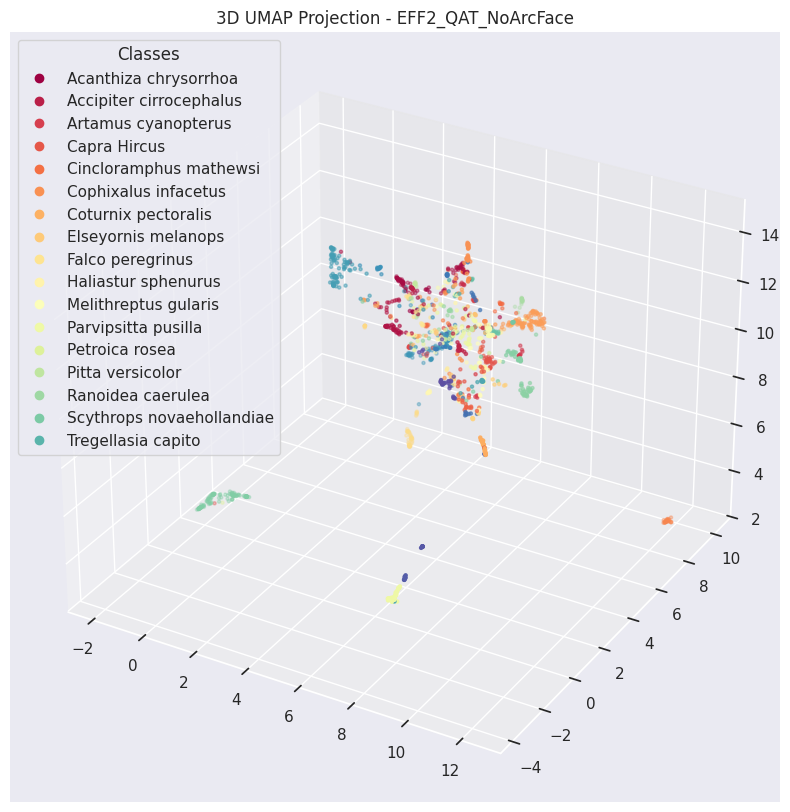

Evaluating Quantised Model: EFF2_QAT_NoArcFace


/tmp/ipython-input-3493734938.py:46: DeprecationWarning: torch.ao.quantization is deprecated and will be removed in 2.10. 
For migrations of users: 
1. Eager mode quantization (torch.ao.quantization.quantize, torch.ao.quantization.quantize_dynamic), please migrate to use torchao eager mode quantize_ API instead 
2. FX graph mode quantization (torch.ao.quantization.quantize_fx.prepare_fx,torch.ao.quantization.quantize_fx.convert_fx, please migrate to use torchao pt2e quantization API instead (prepare_pt2e, convert_pt2e) 
3. pt2e quantization has been migrated to torchao (https://github.com/pytorch/ao/tree/main/torchao/quantization/pt2e) 
see https://github.com/pytorch/ao/issues/2259 for more details
  self.model = convert_fx(self.model)
/usr/local/lib/python3.12/dist-packages/torch/ao/quantization/observer.py:246: UserWarning: Please use quant_min and quant_max to specify the range for observers.                     reduce_range will be deprecated in a future release of PyTorch.
  warni


### Classification Metrics for EFF2_QAT_NoArcFace ###

Overall Accuracy: 0.9295
Total Inference Time: 307.31 seconds
Average Time per Sample: 204.4631 ms

Weighted Precision: 0.9288
Weighted Recall: 0.9295
Weighted F1-Score: 0.9262



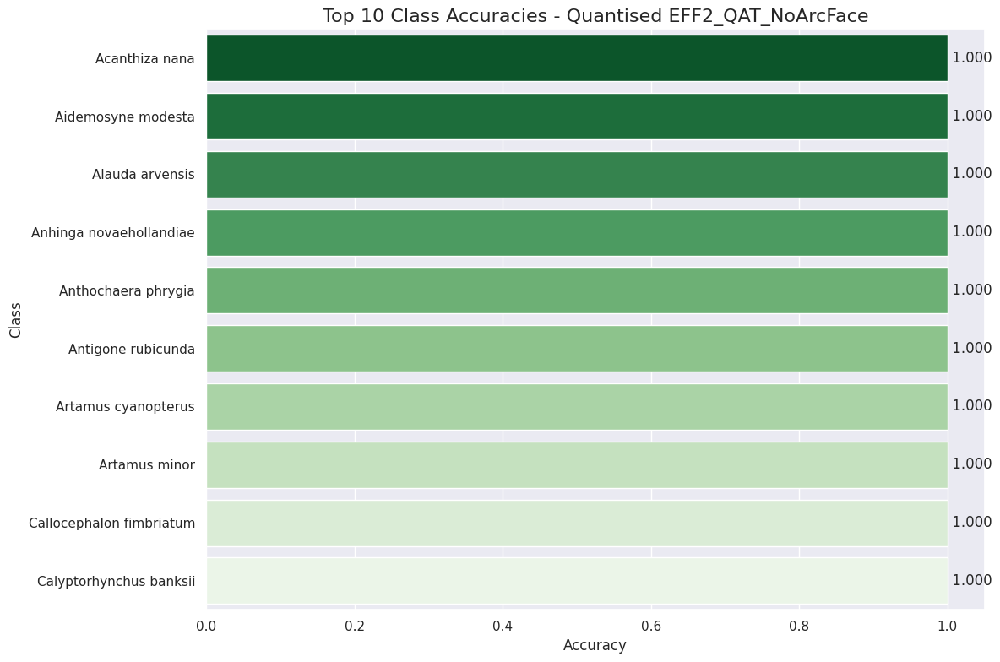

/tmp/ipython-input-1971603019.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=worst_10_accs, y=worst_10_names, palette="Reds_r", orient='h')


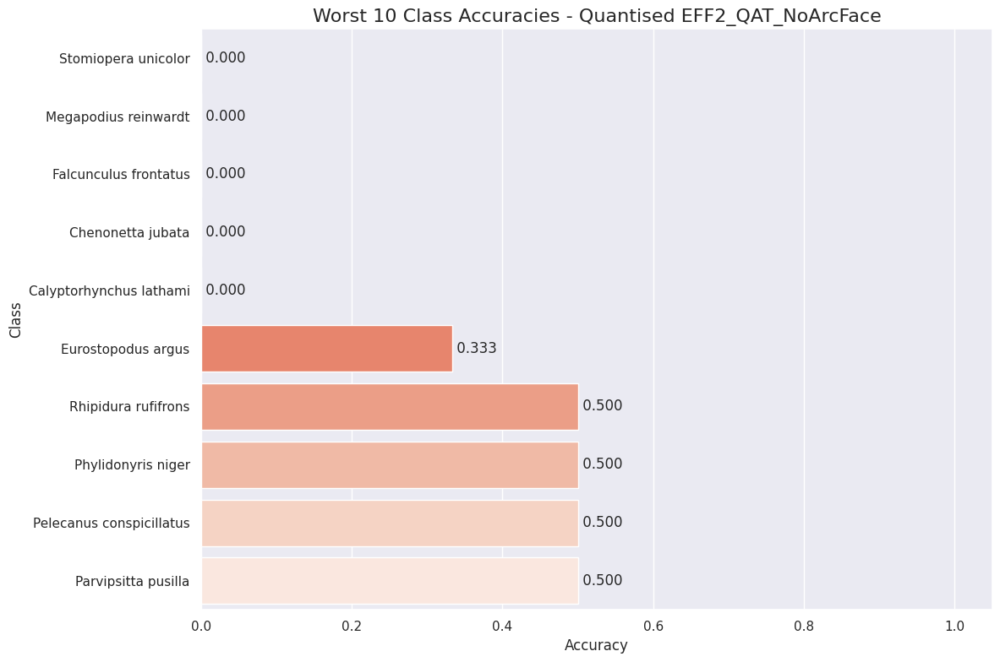


### UMAP Visualizations for Quantised EFF2_QAT_NoArcFace ###

Generating 2D UMAP plot...


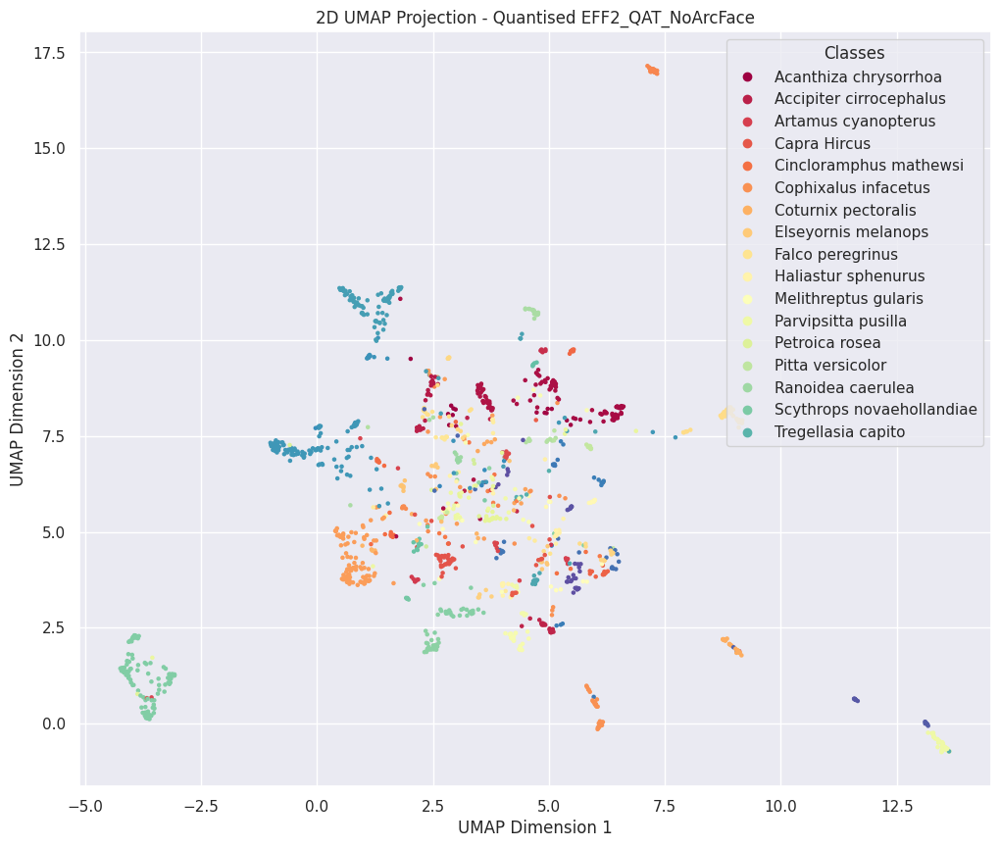

Generating 3D UMAP plot...


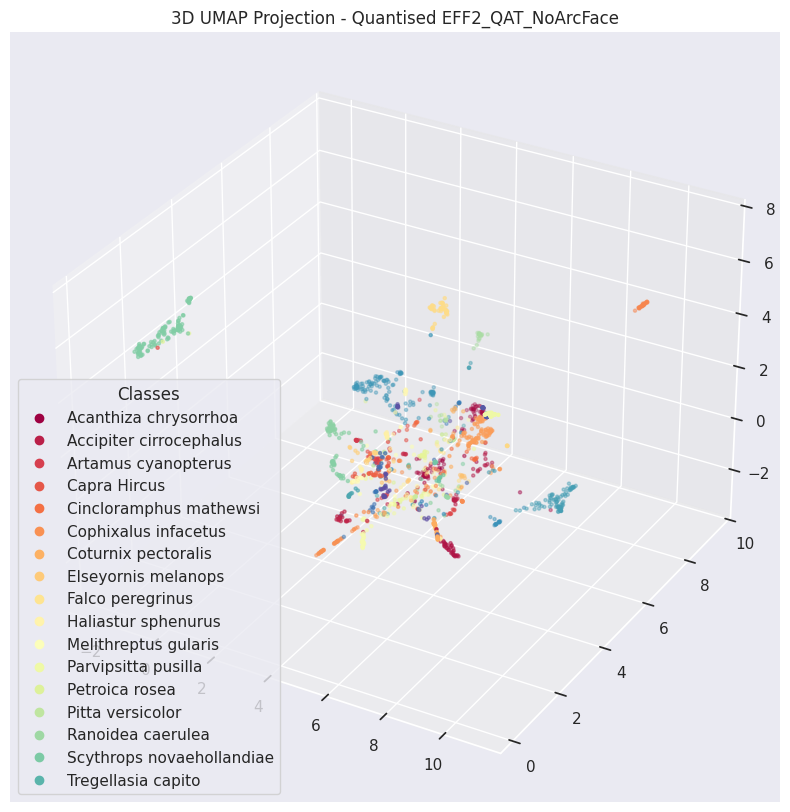

In [ ]:
evaluate_models_from_paths(model_paths, configs, val_loader, class_names, torch.device("cpu"))

In [ ]:
for i, model_path in enumerate(model_paths):
	model = Model(configs[i])
	model.load_state_dict(torch.load(model_path))
	print(model.model.head.weight.shape)

	# model_name = Path(model_path).stem.replace('best_', '')

	# torch.save(model.model.state_dict(), f"best_{model_name}.pth")

Adapting pretrained weights of first conv layer from 3 to 1 channels.
Model unfrozen: All layers are now trainable.
Model fusion completed successfully.


/tmp/ipython-input-177527490.py:4: DeprecationWarning: torch.ao.quantization is deprecated and will be removed in 2.10. 
For migrations of users: 
1. Eager mode quantization (torch.ao.quantization.quantize, torch.ao.quantization.quantize_dynamic), please migrate to use torchao eager mode quantize_ API instead 
2. FX graph mode quantization (torch.ao.quantization.quantize_fx.prepare_fx,torch.ao.quantization.quantize_fx.convert_fx, please migrate to use torchao pt2e quantization API instead (prepare_pt2e, convert_pt2e) 
3. pt2e quantization has been migrated to torchao (https://github.com/pytorch/ao/tree/main/torchao/quantization/pt2e) 
see https://github.com/pytorch/ao/issues/2259 for more details
  prepared_qat = __prepare_qat_fx(float_model, qconfig_mapping, example_inputs=example_inputs)
/usr/local/lib/python3.12/dist-packages/torch/ao/quantization/observer.py:246: UserWarning: Please use quant_min and quant_max to specify the range for observers.                     reduce_range wil

torch.Size([118, 1280])
Adapting pretrained weights of first conv layer from 3 to 1 channels.
Model unfrozen: All layers are now trainable.
Model fusion completed successfully.


/tmp/ipython-input-177527490.py:4: DeprecationWarning: torch.ao.quantization is deprecated and will be removed in 2.10. 
For migrations of users: 
1. Eager mode quantization (torch.ao.quantization.quantize, torch.ao.quantization.quantize_dynamic), please migrate to use torchao eager mode quantize_ API instead 
2. FX graph mode quantization (torch.ao.quantization.quantize_fx.prepare_fx,torch.ao.quantization.quantize_fx.convert_fx, please migrate to use torchao pt2e quantization API instead (prepare_pt2e, convert_pt2e) 
3. pt2e quantization has been migrated to torchao (https://github.com/pytorch/ao/tree/main/torchao/quantization/pt2e) 
see https://github.com/pytorch/ao/issues/2259 for more details
  prepared_qat = __prepare_qat_fx(float_model, qconfig_mapping, example_inputs=example_inputs)
/usr/local/lib/python3.12/dist-packages/torch/ao/quantization/observer.py:246: UserWarning: Please use quant_min and quant_max to specify the range for observers.                     reduce_range wil

torch.Size([118, 1280])
